# 语言翻译

在此项目中，你将了解神经网络机器翻译这一领域。你将用由英语和法语语句组成的数据集，训练一个序列到序列模型（sequence to sequence model），该模型能够将新的英语句子翻译成法语。

## 获取数据

因为将整个英语语言内容翻译成法语需要大量训练时间，所以我们提供了一小部分的英语语料库。


In [1]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper
import problem_unittests as tests

source_path = 'data/small_vocab_en'
target_path = 'data/small_vocab_fr'
source_text = helper.load_data(source_path)
target_text = helper.load_data(target_path)

## 探索数据

研究 view_sentence_range，查看并熟悉该数据的不同部分。


In [2]:
view_sentence_range = (0, 10)

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

print('Dataset Stats')
print('Roughly the number of unique words: {}'.format(len({word: None for word in source_text.split()})))

sentences = source_text.split('\n')
word_counts = [len(sentence.split()) for sentence in sentences]
print('Number of sentences: {}'.format(len(sentences)))
print('Average number of words in a sentence: {}'.format(np.average(word_counts)))

print()
print('English sentences {} to {}:'.format(*view_sentence_range))
print('\n'.join(source_text.split('\n')[view_sentence_range[0]:view_sentence_range[1]]))
print()
print('French sentences {} to {}:'.format(*view_sentence_range))
print('\n'.join(target_text.split('\n')[view_sentence_range[0]:view_sentence_range[1]]))

Dataset Stats
Roughly the number of unique words: 227
Number of sentences: 137861
Average number of words in a sentence: 13.225277634719028

English sentences 0 to 10:
new jersey is sometimes quiet during autumn , and it is snowy in april .
the united states is usually chilly during july , and it is usually freezing in november .
california is usually quiet during march , and it is usually hot in june .
the united states is sometimes mild during june , and it is cold in september .
your least liked fruit is the grape , but my least liked is the apple .
his favorite fruit is the orange , but my favorite is the grape .
paris is relaxing during december , but it is usually chilly in july .
new jersey is busy during spring , and it is never hot in march .
our least liked fruit is the lemon , but my least liked is the grape .
the united states is sometimes busy during january , and it is sometimes warm in november .

French sentences 0 to 10:
new jersey est parfois calme pendant l' automne 

## 实现预处理函数

### 文本到单词 id

和之前的 RNN 一样，你必须首先将文本转换为数字，这样计算机才能读懂。在函数 `text_to_ids()` 中，你需要将单词中的 `source_text` 和 `target_text` 转为 id。但是，你需要在 `target_text` 中每个句子的末尾，添加 `<EOS>` 单词 id。这样可以帮助神经网络预测句子应该在什么地方结束。


你可以通过以下代码获取  `<EOS> ` 单词ID：

```python
target_vocab_to_int['<EOS>']
```

你可以使用 `source_vocab_to_int` 和 `target_vocab_to_int` 获得其他单词 id。


In [3]:
source_text_set = [word for line in source_text.split('\n') for word in line.split()]
print(source_text_set[:20])

['new', 'jersey', 'is', 'sometimes', 'quiet', 'during', 'autumn', ',', 'and', 'it', 'is', 'snowy', 'in', 'april', '.', 'the', 'united', 'states', 'is', 'usually']


In [4]:
def text_to_ids(source_text, target_text, source_vocab_to_int, target_vocab_to_int):
    """
    Convert source and target text to proper word ids
    :param source_text: String that contains all the source text.
    :param target_text: String that contains all the target text.
    :param source_vocab_to_int: Dictionary to go from the source words to an id
    :param target_vocab_to_int: Dictionary to go from the target words to an id
    :return: A tuple of lists (source_id_text, target_id_text)
    """
    # TODO: Implement Function
    #  
    eos = target_vocab_to_int['<EOS>']
    
    # source_text_set = set([word for line in source_text.split('\n') for word in line.split()])  # 不用split(' ')， 不要扁平化！！！
    source_id_text = [[source_vocab_to_int[word] for word in line.split()] for line in source_text.split('\n')]
    print(source_id_text)
    
    # target_line = [line + ' <EOS>' for line in target_text.split('\n')]
    
    target_id_text = [[target_vocab_to_int[word] for word in line.split()] + [eos] for line in target_text.split('\n')]
    print(target_id_text)
    return source_id_text, target_id_text

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_text_to_ids(text_to_ids)

[[21, 17, 26, 11, 12, 22, 20, 28, 7, 24, 26, 23, 30, 4, 8], [31, 18, 9, 26, 15, 32, 22, 6, 28, 7, 24, 26, 15, 16, 30, 5, 8], [10, 26, 15, 12, 22, 19, 28, 7, 24, 26, 15, 14, 30, 27, 8], [31, 18, 9, 26, 11, 29, 22, 27, 28, 7, 24, 26, 13, 30, 25, 8]]
[[24, 21, 27, 23, 30, 6, 22, 9, 31, 14, 32, 27, 4, 5, 29, 7, 1], [18, 17, 27, 19, 15, 5, 26, 31, 14, 32, 8, 28, 5, 16, 7, 1], [11, 27, 19, 30, 5, 13, 31, 14, 32, 27, 19, 33, 5, 25, 7, 1], [18, 17, 27, 23, 12, 5, 25, 31, 14, 32, 20, 15, 5, 10, 7, 1]]
Tests Passed


### 预处理所有数据并保存

运行以下代码单元，预处理所有数据，并保存到文件中。


In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
helper.preprocess_and_save_data(source_path, target_path, text_to_ids)

[[157, 99, 225, 196, 199, 105, 155, 227, 10, 220, 225, 219, 53, 61, 189], [116, 33, 191, 225, 92, 118, 105, 186, 227, 10, 220, 225, 92, 96, 53, 8, 189], [77, 225, 92, 199, 105, 153, 227, 10, 220, 225, 92, 26, 53, 226, 189], [116, 33, 191, 225, 196, 51, 105, 226, 227, 10, 220, 225, 202, 53, 44, 189], [123, 72, 4, 170, 225, 116, 27, 227, 140, 93, 72, 4, 225, 116, 166, 189], [217, 208, 170, 225, 116, 79, 227, 140, 93, 208, 225, 116, 27, 189], [124, 225, 107, 105, 212, 227, 140, 220, 225, 92, 118, 53, 186, 189], [157, 99, 225, 40, 105, 206, 227, 10, 220, 225, 112, 26, 53, 153, 189], [175, 72, 4, 170, 225, 116, 161, 227, 140, 93, 72, 4, 225, 116, 27, 189], [116, 33, 191, 225, 196, 40, 105, 167, 227, 10, 220, 225, 196, 80, 53, 8, 189], [116, 179, 225, 47, 72, 4, 170, 227, 140, 116, 149, 225, 93, 72, 4, 189], [131, 25, 85, 50, 194, 115, 189], [42, 225, 187, 105, 226, 227, 10, 220, 225, 196, 80, 53, 8, 189], [12, 119, 18, 93, 216, 28, 58, 189], [131, 156, 130, 227, 66, 227, 10, 67, 189], [47, 

[[65, 216, 175, 87, 323, 182, 64, 117, 92, 228, 45, 175, 158, 48, 303, 242, 1], [316, 289, 175, 59, 267, 48, 69, 92, 228, 45, 50, 354, 48, 286, 242, 1], [210, 175, 59, 323, 48, 266, 92, 228, 45, 175, 59, 46, 48, 253, 242, 1], [316, 289, 175, 87, 81, 48, 253, 92, 228, 45, 125, 267, 48, 7, 242, 1], [315, 34, 43, 233, 175, 166, 27, 92, 44, 294, 34, 43, 175, 162, 190, 242, 1], [272, 233, 337, 175, 115, 92, 44, 294, 337, 175, 166, 27, 242, 1], [138, 175, 128, 48, 297, 92, 44, 45, 175, 59, 267, 48, 69, 242, 1], [65, 216, 175, 356, 199, 16, 92, 228, 45, 175, 243, 170, 48, 266, 242, 1], [156, 233, 175, 34, 43, 166, 168, 92, 44, 294, 34, 43, 175, 166, 27, 242, 1], [316, 289, 175, 87, 356, 48, 37, 92, 228, 45, 175, 87, 46, 48, 286, 242, 1], [162, 14, 175, 272, 34, 43, 18, 78, 92, 44, 162, 222, 175, 294, 34, 270, 1], [45, 287, 178, 33, 149, 349, 98, 242, 1], [153, 175, 211, 48, 253, 92, 228, 45, 175, 87, 46, 48, 286, 242, 1], [338, 127, 60, 294, 202, 166, 101, 43, 242, 1], [45, 29, 179, 92, 54, 1

# 检查点

这是你的第一个检查点。如果你什么时候决定再回到该记事本，或需要重新启动该记事本，可以从这里继续。预处理的数据已保存到磁盘上。

In [6]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np
import helper

(source_int_text, target_int_text), (source_vocab_to_int, target_vocab_to_int), _ = helper.load_preprocess()

### 检查 TensorFlow 版本，确认可访问 GPU

这一检查步骤，可以确保你使用的是正确版本的 TensorFlow，并且能够访问 GPU。


In [7]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) in [LooseVersion('1.0.0'), LooseVersion('1.0.1')], 'This project requires TensorFlow version 1.0  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


## 构建神经网络

你将通过实现以下函数，构建出要构建一个序列到序列模型所需的组件：

- `model_inputs`
- `process_decoding_input`
- `encoding_layer`
- `decoding_layer_train`
- `decoding_layer_infer`
- `decoding_layer`
- `seq2seq_model`

### 输入

实现 `model_inputs()` 函数，为神经网络创建 TF 占位符。该函数应该创建以下占位符：

- 名为 “input” 的输入文本占位符，并使用 TF Placeholder 名称参数（等级（Rank）为 2）。
- 目标占位符（等级为 2）。
- 学习速率占位符（等级为 0）。
- 名为 “keep_prob” 的保留率占位符，并使用 TF Placeholder 名称参数（等级为 0）。

在以下元祖（tuple）中返回占位符：（输入、目标、学习速率、保留率）


In [8]:
def model_inputs():
    """
    Create TF Placeholders for input, targets, and learning rate.
    :return: Tuple (input, targets, learning rate, keep probability)
    """
    # TODO: Implement Function
    input = tf.placeholder(tf.int32, [None, None], name='input')
    targets = tf.placeholder(tf.int32, [None, None], name='targets')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    keep_prob = tf.placeholder(tf.float32, name='keep_prob')
    return input, targets, learning_rate, keep_prob

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 处理解码输入

使用 TensorFlow 实现 `process_decoding_input`，以便删掉 `target_data` 中每个批次的最后一个单词 ID，并将 GO ID 放到每个批次的开头。

In [9]:
def process_decoding_input(target_data, target_vocab_to_int, batch_size):
    """
    Preprocess target data for dencoding
    :param target_data: Target Placehoder
    :param target_vocab_to_int: Dictionary to go from the target words to an id
    :param batch_size: Batch Size
    :return: Preprocessed target data
    """
    # TODO: Implement Function
    # tf.strided_slice(data, begin, end, stride)
    end = tf.strided_slice(target_data, [0,0], [batch_size,-1], [1,1])
    decoder_input = tf.concat([tf.fill([batch_size,1], target_vocab_to_int['<GO>']), end], 1)  # 注意
    return decoder_input

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_process_decoding_input(process_decoding_input)

Tests Passed


### 编码

实现 `encoding_layer()`，以使用 [`tf.nn.dynamic_rnn()`](https://www.tensorflow.org/api_docs/python/tf/nn/dynamic_rnn) 创建编码器 RNN 层级。

In [10]:
def encoding_layer(rnn_inputs, rnn_size, num_layers, keep_prob):
    """
    Create encoding layer
    :param rnn_inputs: Inputs for the RNN
    :param rnn_size: RNN Size
    :param num_layers: Number of layers
    :param keep_prob: Dropout keep probability
    :return: RNN state
    """
    # TODO: Implement Function
    cell = tf.contrib.rnn.BasicLSTMCell(rnn_size)
    drop = tf.contrib.rnn.DropoutWrapper(cell, output_keep_prob=keep_prob)
    enc_cell = tf.contrib.rnn.MultiRNNCell([drop] * num_layers)
    _, enc_state = tf.nn.dynamic_rnn(enc_cell, rnn_inputs, dtype=tf.float32)
    return enc_state

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_encoding_layer(encoding_layer)

Tests Passed


### 解码 - 训练

使用 [`tf.contrib.seq2seq.simple_decoder_fn_train()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/simple_decoder_fn_train) 和 [`tf.contrib.seq2seq.dynamic_rnn_decoder()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/dynamic_rnn_decoder) 创建训练分对数（training logits）。将 `output_fn` 应用到 [`tf.contrib.seq2seq.dynamic_rnn_decoder()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/dynamic_rnn_decoder) 输出上。

In [11]:
def decoding_layer_train(encoder_state, dec_cell, dec_embed_input, sequence_length, decoding_scope,
                         output_fn, keep_prob):
    """
    Create a decoding layer for training
    :param encoder_state: Encoder State
    :param dec_cell: Decoder RNN Cell
    :param dec_embed_input: Decoder embedded input
    :param sequence_length: Sequence Length
    :param decoding_scope: TenorFlow Variable Scope for decoding
    :param output_fn: Function to apply the output layer
    :param keep_prob: Dropout keep probability
    :return: Train Logits
    """
    # TODO: Implement Function
    # tf.contrib.seq2seq.simple_decoder_fn_train(encoder_state, name=None)在dynamic_rnn_decoder中使用的序列到序列模型的简单解码器。
    # simple_decoder_fn_train是序列到序列模型的简单训练函数。当dynamic_rnn_decoder处于训练模式时应该使用它。
    # tf.contrib.seq2seq.dynamic_rnn_decoder(cell, decoder_fn, inputs=None, sequence_length=None, parallel_iterations=None, swap_memory=False, time_major=False, scope=None, name=None)
    # 由RNNCell和解码器功能规定的序列到序列模型的动态RNN(drnn)解码器。有训练和推理两种模式。
    
    dec_fn_train = tf.contrib.seq2seq.simple_decoder_fn_train(encoder_state)
    outputs_train, _, _ = tf.contrib.seq2seq.dynamic_rnn_decoder(dec_cell, dec_fn_train, dec_embed_input, sequence_length, scope=decoding_scope)
    logits_train = output_fn(outputs_train)
    
    # dropout
    logits = tf.nn.dropout(logits_train, keep_prob)
    return logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_decoding_layer_train(decoding_layer_train)

Tests Passed


### 解码 - 推论

使用 [`tf.contrib.seq2seq.simple_decoder_fn_inference()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/simple_decoder_fn_inference) 和 [`tf.contrib.seq2seq.dynamic_rnn_decoder()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/dynamic_rnn_decoder) 创建推论分对数（inference logits）。

In [12]:
def decoding_layer_infer(encoder_state, dec_cell, dec_embeddings, start_of_sequence_id, end_of_sequence_id,
                         maximum_length, vocab_size, decoding_scope, output_fn, keep_prob):
    """
    Create a decoding layer for inference
    :param encoder_state: Encoder state
    :param dec_cell: Decoder RNN Cell
    :param dec_embeddings: Decoder embeddings
    :param start_of_sequence_id: GO ID
    :param end_of_sequence_id: EOS Id
    :param maximum_length: The maximum allowed time steps to decode
    :param vocab_size: Size of vocabulary
    :param decoding_scope: TensorFlow Variable Scope for decoding
    :param output_fn: Function to apply the output layer
    :param keep_prob: Dropout keep probability
    :return: Inference Logits
    """
    # TODO: Implement Function
    # tf.contrib.seq2seq.simple_decoder_fn_inference(output_fn, encoder_state, embeddings, start_of_sequence_id, 
    # end_of_sequence_id, maximum_length, num_decoder_symbols, dtype=tf.int32, name=None)在dynamic_rnn_decoder中使用的序列到序列模型的简单解码器
    # simple_decoder_fn_inference是序列到序列模型的简单推理函数。当dynamic_rnn_decoder处于推理模式时应该使用。
    
    
    dec_fn_infer = tf.contrib.seq2seq.simple_decoder_fn_inference(output_fn, 
                                                                  encoder_state, 
                                                                  dec_embeddings, 
                                                                  start_of_sequence_id, 
                                                                  end_of_sequence_id, 
                                                                  maximum_length, 
                                                                  vocab_size)
    dropouted = tf.contrib.rnn.DropoutWrapper(dec_cell, keep_prob)
    logits_infer, _, _ = tf.contrib.seq2seq.dynamic_rnn_decoder(dropouted, dec_fn_infer, 
                                                                sequence_length=maximum_length, 
                                                                scope=decoding_scope)
    return logits_infer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_decoding_layer_infer(decoding_layer_infer)

Tests Passed


### 构建解码层级

实现 `decoding_layer()` 以创建解码器 RNN 层级。

- 使用 `rnn_size` 和 `num_layers` 创建解码 RNN 单元。
- 使用 [`lambda`](https://docs.python.org/3/tutorial/controlflow.html#lambda-expressions) 创建输出函数，将输入，也就是分对数转换为类分对数（class logits）。
- 使用 `decoding_layer_train(encoder_state, dec_cell, dec_embed_input, sequence_length, decoding_scope, output_fn, keep_prob)` 函数获取训练分对数。
- 使用 `decoding_layer_infer(encoder_state, dec_cell, dec_embeddings, start_of_sequence_id, end_of_sequence_id, maximum_length, vocab_size, decoding_scope, output_fn, keep_prob)` 函数获取推论分对数。

注意：你将需要使用 [tf.variable_scope](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 在训练和推论分对数间分享变量。

In [13]:
def decoding_layer(dec_embed_input, dec_embeddings, encoder_state, vocab_size, sequence_length, rnn_size,
                   num_layers, target_vocab_to_int, keep_prob):
    """
    Create decoding layer
    :param dec_embed_input: Decoder embedded input
    :param dec_embeddings: Decoder embeddings
    :param encoder_state: The encoded state
    :param vocab_size: Size of vocabulary
    :param sequence_length: Sequence Length
    :param rnn_size: RNN Size
    :param num_layers: Number of layers
    :param target_vocab_to_int: Dictionary to go from the target words to an id
    :param keep_prob: Dropout keep probability
    :return: Tuple of (Training Logits, Inference Logits)
    """
    # TODO: Implement Function
    
    # 多层lstm
    lstm = tf.contrib.rnn.BasicLSTMCell(rnn_size)
    dropout = tf.contrib.rnn.DropoutWrapper(lstm, keep_prob)
    dec_cell = tf.contrib.rnn.MultiRNNCell([dropout] * num_layers)
    
    max_target_sentence_length = max([len(sentence) for sentence in source_int_text])
    
    with tf.variable_scope('decoding_layer') as decoding_scope:
        # 全连接层
        output_fn = lambda x: tf.contrib.layers.fully_connected(x, vocab_size, None, scope=decoding_scope)
    
    # 解码训练
    with tf.variable_scope('decoding_layer') as decoding_scope:
        logits_train = decoding_layer_train(encoder_state, dec_cell, dec_embed_input, 
                                            sequence_length, decoding_scope, output_fn, keep_prob)
    
    # 解码 推理
    with tf.variable_scope('decoding_layer', reuse=True) as decoding_scope:
        logits_infer = decoding_layer_infer(encoder_state, dec_cell, dec_embeddings, 
                                            target_vocab_to_int['<GO>'], target_vocab_to_int['<EOS>'], 
                                            max_target_sentence_length, 
                                            vocab_size, decoding_scope, output_fn, keep_prob)
    
    return logits_train, logits_infer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_decoding_layer(decoding_layer)

Tests Passed


### 构建神经网络

应用你在上方实现的函数，以：

- 向编码器的输入数据应用嵌入。
- 使用 `encoding_layer(rnn_inputs, rnn_size, num_layers, keep_prob)` 编码输入。
- 使用 `process_decoding_input(target_data, target_vocab_to_int, batch_size)` 函数处理目标数据。
- 向解码器的目标数据应用嵌入。
- 使用 `decoding_layer(dec_embed_input, dec_embeddings, encoder_state, vocab_size, sequence_length, rnn_size, num_layers, target_vocab_to_int, keep_prob)` 解码编码的输入数据。

In [14]:
def seq2seq_model(input_data, target_data, keep_prob, batch_size, sequence_length, source_vocab_size, target_vocab_size,
                  enc_embedding_size, dec_embedding_size, rnn_size, num_layers, target_vocab_to_int):
    """
    Build the Sequence-to-Sequence part of the neural network
    :param input_data: Input placeholder
    :param target_data: Target placeholder
    :param keep_prob: Dropout keep probability placeholder
    :param batch_size: Batch Size
    :param sequence_length: Sequence Length
    :param source_vocab_size: Source vocabulary size
    :param target_vocab_size: Target vocabulary size
    :param enc_embedding_size: Decoder embedding size
    :param dec_embedding_size: Encoder embedding size
    :param rnn_size: RNN Size
    :param num_layers: Number of layers
    :param target_vocab_to_int: Dictionary to go from the target words to an id
    :return: Tuple of (Training Logits, Inference Logits)
    """
    # TODO: Implement Function
    
    # tf.contrib.layers.embed_sequence将一系列符号(字符)映射到嵌入序列。典型的用例是在编码器和解码器之间重用嵌入。
    # tf.nn.embedding_lookup在嵌入张量列表中查找ids。

    enc_embed_input = tf.contrib.layers.embed_sequence(input_data, source_vocab_size, enc_embedding_size)
    enc_state = encoding_layer(enc_embed_input, rnn_size, num_layers, keep_prob)
    
    dec_input = process_decoding_input(target_data, target_vocab_to_int, batch_size)
    dec_embeddings = tf.Variable(tf.truncated_normal([target_vocab_size, dec_embedding_size], stddev=0.01))
    dec_embed_input = tf.nn.embedding_lookup(dec_embeddings, dec_input)
    logits_train, logits_infer = decoding_layer(dec_embed_input, dec_embeddings, 
                                                enc_state, target_vocab_size, 
                                                sequence_length, rnn_size, num_layers, 
                                                target_vocab_to_int, keep_prob)
    
    return logits_train, logits_infer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_seq2seq_model(seq2seq_model)

Tests Passed


## 训练神经网络

### 超参数

调试以下参数：

- 将 `epochs` 设为 epoch 次数。
- 将 `batch_size` 设为批次大小。
- 将 `rnn_size` 设为 RNN 的大小。
- 将 `num_layers` 设为层级数量。
- 将 `encoding_embedding_size` 设为编码器嵌入大小。
- 将 `decoding_embedding_size` 设为解码器嵌入大小
- 将 `learning_rate` 设为训练速率。
- 将 `keep_probability` 设为丢弃保留率（Dropout keep probability）。

In [15]:
# Number of Epochs
epochs = 10
# Batch Size
batch_size = 256
# RNN Size
rnn_size = 256
# Number of Layers
num_layers = 3
# Embedding Size
encoding_embedding_size = 128
decoding_embedding_size = 128
# Learning Rate
learning_rate = 0.01
# Dropout Keep Probability
keep_probability = 0.8

### 构建图表

使用你实现的神经网络构建图表。

In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
save_path = 'checkpoints/'
(source_int_text, target_int_text), (source_vocab_to_int, target_vocab_to_int), _ = helper.load_preprocess()
max_source_sentence_length = max([len(sentence) for sentence in source_int_text])

train_graph = tf.Graph()
with train_graph.as_default():
    input_data, targets, lr, keep_prob = model_inputs()
    sequence_length = tf.placeholder_with_default(max_source_sentence_length, None, name='sequence_length')
    input_shape = tf.shape(input_data)
    
    train_logits, inference_logits = seq2seq_model(
        tf.reverse(input_data, [-1]), targets, keep_prob, batch_size, sequence_length, len(source_vocab_to_int), len(target_vocab_to_int),
        encoding_embedding_size, decoding_embedding_size, rnn_size, num_layers, target_vocab_to_int)

    tf.identity(inference_logits, 'logits')
    with tf.name_scope("optimization"):
        # Loss function
        cost = tf.contrib.seq2seq.sequence_loss(
            train_logits,
            targets,
            tf.ones([input_shape[0], sequence_length]))

        # Optimizer
        optimizer = tf.train.AdamOptimizer(lr)

        # Gradient Clipping
        gradients = optimizer.compute_gradients(cost)
        capped_gradients = [(tf.clip_by_value(grad, -1., 1.), var) for grad, var in gradients if grad is not None]
        train_op = optimizer.apply_gradients(capped_gradients)

### 训练

利用预处理的数据训练神经网络。如果很难获得低损失值，请访问我们的论坛，看看其他人是否遇到了相同的问题。

In [17]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import time

def get_accuracy(target, logits):
    """
    Calculate accuracy
    """
    max_seq = max(target.shape[1], logits.shape[1])
    if max_seq - target.shape[1]:
        target = np.pad(
            target,
            [(0,0),(0,max_seq - target.shape[1])],
            'constant')
    if max_seq - logits.shape[1]:
        logits = np.pad(
            logits,
            [(0,0),(0,max_seq - logits.shape[1]), (0,0)],
            'constant')

    return np.mean(np.equal(target, np.argmax(logits, 2)))

train_source = source_int_text[batch_size:]
train_target = target_int_text[batch_size:]

valid_source = helper.pad_sentence_batch(source_int_text[:batch_size])
valid_target = helper.pad_sentence_batch(target_int_text[:batch_size])

with tf.Session(graph=train_graph) as sess:
    sess.run(tf.global_variables_initializer())

    for epoch_i in range(epochs):
        for batch_i, (source_batch, target_batch) in enumerate(
                helper.batch_data(train_source, train_target, batch_size)):
            start_time = time.time()
            
            _, loss = sess.run(
                [train_op, cost],
                {input_data: source_batch,
                 targets: target_batch,
                 lr: learning_rate,
                 sequence_length: target_batch.shape[1],
                 keep_prob: keep_probability})
            
            batch_train_logits = sess.run(
                inference_logits,
                {input_data: source_batch, keep_prob: 1.0})
            batch_valid_logits = sess.run(
                inference_logits,
                {input_data: valid_source, keep_prob: 1.0})
                
            train_acc = get_accuracy(target_batch, batch_train_logits)
            valid_acc = get_accuracy(np.array(valid_target), batch_valid_logits)
            end_time = time.time()
            print('Epoch {:>3} Batch {:>4}/{} - Train Accuracy: {:>6.3f}, Validation Accuracy: {:>6.3f}, Loss: {:>6.3f}'
                  .format(epoch_i, batch_i, len(source_int_text) // batch_size, train_acc, valid_acc, loss))

    # Save Model
    saver = tf.train.Saver()
    saver.save(sess, save_path)
    print('Model Trained and Saved')

Epoch   0 Batch    0/538 - Train Accuracy:  0.186, Validation Accuracy:  0.251, Loss:  5.880
Epoch   0 Batch    1/538 - Train Accuracy:  0.268, Validation Accuracy:  0.346, Loss:  5.746
Epoch   0 Batch    2/538 - Train Accuracy:  0.259, Validation Accuracy:  0.323, Loss:  4.289
Epoch   0 Batch    3/538 - Train Accuracy:  0.169, Validation Accuracy:  0.244, Loss:  4.468
Epoch   0 Batch    4/538 - Train Accuracy:  0.273, Validation Accuracy:  0.350, Loss:  4.823
Epoch   0 Batch    5/538 - Train Accuracy:  0.297, Validation Accuracy:  0.346, Loss:  4.266
Epoch   0 Batch    6/538 - Train Accuracy:  0.305, Validation Accuracy:  0.347, Loss:  4.112
Epoch   0 Batch    7/538 - Train Accuracy:  0.287, Validation Accuracy:  0.354, Loss:  4.003
Epoch   0 Batch    8/538 - Train Accuracy:  0.283, Validation Accuracy:  0.350, Loss:  4.009
Epoch   0 Batch    9/538 - Train Accuracy:  0.265, Validation Accuracy:  0.335, Loss:  3.940
Epoch   0 Batch   10/538 - Train Accuracy:  0.262, Validation Accuracy

Epoch   0 Batch   89/538 - Train Accuracy:  0.389, Validation Accuracy:  0.439, Loss:  2.013
Epoch   0 Batch   90/538 - Train Accuracy:  0.412, Validation Accuracy:  0.436, Loss:  2.000
Epoch   0 Batch   91/538 - Train Accuracy:  0.374, Validation Accuracy:  0.437, Loss:  1.973
Epoch   0 Batch   92/538 - Train Accuracy:  0.379, Validation Accuracy:  0.436, Loss:  2.020
Epoch   0 Batch   93/538 - Train Accuracy:  0.372, Validation Accuracy:  0.439, Loss:  2.016
Epoch   0 Batch   94/538 - Train Accuracy:  0.359, Validation Accuracy:  0.439, Loss:  1.964
Epoch   0 Batch   95/538 - Train Accuracy:  0.437, Validation Accuracy:  0.431, Loss:  1.875
Epoch   0 Batch   96/538 - Train Accuracy:  0.407, Validation Accuracy:  0.432, Loss:  1.918
Epoch   0 Batch   97/538 - Train Accuracy:  0.355, Validation Accuracy:  0.431, Loss:  1.984
Epoch   0 Batch   98/538 - Train Accuracy:  0.406, Validation Accuracy:  0.436, Loss:  1.932
Epoch   0 Batch   99/538 - Train Accuracy:  0.351, Validation Accuracy

Epoch   0 Batch  178/538 - Train Accuracy:  0.476, Validation Accuracy:  0.498, Loss:  1.606
Epoch   0 Batch  179/538 - Train Accuracy:  0.441, Validation Accuracy:  0.494, Loss:  1.674
Epoch   0 Batch  180/538 - Train Accuracy:  0.493, Validation Accuracy:  0.497, Loss:  1.604
Epoch   0 Batch  181/538 - Train Accuracy:  0.443, Validation Accuracy:  0.497, Loss:  1.668
Epoch   0 Batch  182/538 - Train Accuracy:  0.422, Validation Accuracy:  0.464, Loss:  1.579
Epoch   0 Batch  183/538 - Train Accuracy:  0.449, Validation Accuracy:  0.460, Loss:  1.590
Epoch   0 Batch  184/538 - Train Accuracy:  0.435, Validation Accuracy:  0.466, Loss:  1.564
Epoch   0 Batch  185/538 - Train Accuracy:  0.396, Validation Accuracy:  0.460, Loss:  1.628
Epoch   0 Batch  186/538 - Train Accuracy:  0.445, Validation Accuracy:  0.457, Loss:  1.557
Epoch   0 Batch  187/538 - Train Accuracy:  0.480, Validation Accuracy:  0.483, Loss:  1.572
Epoch   0 Batch  188/538 - Train Accuracy:  0.422, Validation Accuracy

Epoch   0 Batch  267/538 - Train Accuracy:  0.547, Validation Accuracy:  0.570, Loss:  1.493
Epoch   0 Batch  268/538 - Train Accuracy:  0.585, Validation Accuracy:  0.572, Loss:  1.466
Epoch   0 Batch  269/538 - Train Accuracy:  0.556, Validation Accuracy:  0.576, Loss:  1.531
Epoch   0 Batch  270/538 - Train Accuracy:  0.544, Validation Accuracy:  0.573, Loss:  1.512
Epoch   0 Batch  271/538 - Train Accuracy:  0.545, Validation Accuracy:  0.570, Loss:  1.551
Epoch   0 Batch  272/538 - Train Accuracy:  0.536, Validation Accuracy:  0.574, Loss:  1.505
Epoch   0 Batch  273/538 - Train Accuracy:  0.553, Validation Accuracy:  0.566, Loss:  1.515
Epoch   0 Batch  274/538 - Train Accuracy:  0.522, Validation Accuracy:  0.554, Loss:  1.548
Epoch   0 Batch  275/538 - Train Accuracy:  0.536, Validation Accuracy:  0.562, Loss:  1.545
Epoch   0 Batch  276/538 - Train Accuracy:  0.562, Validation Accuracy:  0.573, Loss:  1.528
Epoch   0 Batch  277/538 - Train Accuracy:  0.564, Validation Accuracy

Epoch   0 Batch  356/538 - Train Accuracy:  0.600, Validation Accuracy:  0.621, Loss:  1.429
Epoch   0 Batch  357/538 - Train Accuracy:  0.620, Validation Accuracy:  0.624, Loss:  1.390
Epoch   0 Batch  358/538 - Train Accuracy:  0.596, Validation Accuracy:  0.615, Loss:  1.410
Epoch   0 Batch  359/538 - Train Accuracy:  0.612, Validation Accuracy:  0.616, Loss:  1.422
Epoch   0 Batch  360/538 - Train Accuracy:  0.621, Validation Accuracy:  0.616, Loss:  1.469
Epoch   0 Batch  361/538 - Train Accuracy:  0.633, Validation Accuracy:  0.609, Loss:  1.447
Epoch   0 Batch  362/538 - Train Accuracy:  0.618, Validation Accuracy:  0.625, Loss:  1.396
Epoch   0 Batch  363/538 - Train Accuracy:  0.592, Validation Accuracy:  0.613, Loss:  1.424
Epoch   0 Batch  364/538 - Train Accuracy:  0.595, Validation Accuracy:  0.615, Loss:  1.476
Epoch   0 Batch  365/538 - Train Accuracy:  0.586, Validation Accuracy:  0.597, Loss:  1.443
Epoch   0 Batch  366/538 - Train Accuracy:  0.588, Validation Accuracy

Epoch   0 Batch  445/538 - Train Accuracy:  0.655, Validation Accuracy:  0.636, Loss:  1.361
Epoch   0 Batch  446/538 - Train Accuracy:  0.663, Validation Accuracy:  0.642, Loss:  1.390
Epoch   0 Batch  447/538 - Train Accuracy:  0.625, Validation Accuracy:  0.641, Loss:  1.397
Epoch   0 Batch  448/538 - Train Accuracy:  0.656, Validation Accuracy:  0.648, Loss:  1.353
Epoch   0 Batch  449/538 - Train Accuracy:  0.661, Validation Accuracy:  0.643, Loss:  1.372
Epoch   0 Batch  450/538 - Train Accuracy:  0.647, Validation Accuracy:  0.658, Loss:  1.404
Epoch   0 Batch  451/538 - Train Accuracy:  0.637, Validation Accuracy:  0.661, Loss:  1.404
Epoch   0 Batch  452/538 - Train Accuracy:  0.648, Validation Accuracy:  0.658, Loss:  1.382
Epoch   0 Batch  453/538 - Train Accuracy:  0.644, Validation Accuracy:  0.640, Loss:  1.388
Epoch   0 Batch  454/538 - Train Accuracy:  0.649, Validation Accuracy:  0.642, Loss:  1.342
Epoch   0 Batch  455/538 - Train Accuracy:  0.677, Validation Accuracy

Epoch   0 Batch  534/538 - Train Accuracy:  0.674, Validation Accuracy:  0.664, Loss:  1.288
Epoch   0 Batch  535/538 - Train Accuracy:  0.660, Validation Accuracy:  0.671, Loss:  1.328
Epoch   0 Batch  536/538 - Train Accuracy:  0.658, Validation Accuracy:  0.647, Loss:  1.281
Epoch   1 Batch    0/538 - Train Accuracy:  0.667, Validation Accuracy:  0.656, Loss:  1.358
Epoch   1 Batch    1/538 - Train Accuracy:  0.663, Validation Accuracy:  0.664, Loss:  1.324
Epoch   1 Batch    2/538 - Train Accuracy:  0.644, Validation Accuracy:  0.665, Loss:  1.371
Epoch   1 Batch    3/538 - Train Accuracy:  0.659, Validation Accuracy:  0.659, Loss:  1.333
Epoch   1 Batch    4/538 - Train Accuracy:  0.677, Validation Accuracy:  0.656, Loss:  1.303
Epoch   1 Batch    5/538 - Train Accuracy:  0.654, Validation Accuracy:  0.669, Loss:  1.337
Epoch   1 Batch    6/538 - Train Accuracy:  0.687, Validation Accuracy:  0.682, Loss:  1.310
Epoch   1 Batch    7/538 - Train Accuracy:  0.678, Validation Accuracy

Epoch   1 Batch   86/538 - Train Accuracy:  0.728, Validation Accuracy:  0.704, Loss:  1.306
Epoch   1 Batch   87/538 - Train Accuracy:  0.726, Validation Accuracy:  0.712, Loss:  1.258
Epoch   1 Batch   88/538 - Train Accuracy:  0.713, Validation Accuracy:  0.707, Loss:  1.295
Epoch   1 Batch   89/538 - Train Accuracy:  0.698, Validation Accuracy:  0.713, Loss:  1.291
Epoch   1 Batch   90/538 - Train Accuracy:  0.713, Validation Accuracy:  0.716, Loss:  1.305
Epoch   1 Batch   91/538 - Train Accuracy:  0.696, Validation Accuracy:  0.717, Loss:  1.330
Epoch   1 Batch   92/538 - Train Accuracy:  0.715, Validation Accuracy:  0.721, Loss:  1.321
Epoch   1 Batch   93/538 - Train Accuracy:  0.698, Validation Accuracy:  0.715, Loss:  1.270
Epoch   1 Batch   94/538 - Train Accuracy:  0.711, Validation Accuracy:  0.694, Loss:  1.310
Epoch   1 Batch   95/538 - Train Accuracy:  0.725, Validation Accuracy:  0.695, Loss:  1.268
Epoch   1 Batch   96/538 - Train Accuracy:  0.714, Validation Accuracy

Epoch   1 Batch  175/538 - Train Accuracy:  0.720, Validation Accuracy:  0.712, Loss:  1.263
Epoch   1 Batch  176/538 - Train Accuracy:  0.712, Validation Accuracy:  0.719, Loss:  1.272
Epoch   1 Batch  177/538 - Train Accuracy:  0.751, Validation Accuracy:  0.736, Loss:  1.274
Epoch   1 Batch  178/538 - Train Accuracy:  0.718, Validation Accuracy:  0.730, Loss:  1.246
Epoch   1 Batch  179/538 - Train Accuracy:  0.735, Validation Accuracy:  0.730, Loss:  1.233
Epoch   1 Batch  180/538 - Train Accuracy:  0.741, Validation Accuracy:  0.733, Loss:  1.211
Epoch   1 Batch  181/538 - Train Accuracy:  0.712, Validation Accuracy:  0.725, Loss:  1.266
Epoch   1 Batch  182/538 - Train Accuracy:  0.734, Validation Accuracy:  0.722, Loss:  1.274
Epoch   1 Batch  183/538 - Train Accuracy:  0.746, Validation Accuracy:  0.715, Loss:  1.218
Epoch   1 Batch  184/538 - Train Accuracy:  0.739, Validation Accuracy:  0.722, Loss:  1.299
Epoch   1 Batch  185/538 - Train Accuracy:  0.716, Validation Accuracy

Epoch   1 Batch  264/538 - Train Accuracy:  0.719, Validation Accuracy:  0.741, Loss:  1.266
Epoch   1 Batch  265/538 - Train Accuracy:  0.751, Validation Accuracy:  0.746, Loss:  1.269
Epoch   1 Batch  266/538 - Train Accuracy:  0.775, Validation Accuracy:  0.741, Loss:  1.207
Epoch   1 Batch  267/538 - Train Accuracy:  0.756, Validation Accuracy:  0.766, Loss:  1.200
Epoch   1 Batch  268/538 - Train Accuracy:  0.778, Validation Accuracy:  0.764, Loss:  1.161
Epoch   1 Batch  269/538 - Train Accuracy:  0.761, Validation Accuracy:  0.761, Loss:  1.257
Epoch   1 Batch  270/538 - Train Accuracy:  0.763, Validation Accuracy:  0.763, Loss:  1.196
Epoch   1 Batch  271/538 - Train Accuracy:  0.762, Validation Accuracy:  0.754, Loss:  1.175
Epoch   1 Batch  272/538 - Train Accuracy:  0.750, Validation Accuracy:  0.757, Loss:  1.269
Epoch   1 Batch  273/538 - Train Accuracy:  0.764, Validation Accuracy:  0.761, Loss:  1.188
Epoch   1 Batch  274/538 - Train Accuracy:  0.723, Validation Accuracy

Epoch   1 Batch  353/538 - Train Accuracy:  0.761, Validation Accuracy:  0.770, Loss:  1.221
Epoch   1 Batch  354/538 - Train Accuracy:  0.778, Validation Accuracy:  0.774, Loss:  1.141
Epoch   1 Batch  355/538 - Train Accuracy:  0.783, Validation Accuracy:  0.782, Loss:  1.200
Epoch   1 Batch  356/538 - Train Accuracy:  0.794, Validation Accuracy:  0.788, Loss:  1.191
Epoch   1 Batch  357/538 - Train Accuracy:  0.786, Validation Accuracy:  0.789, Loss:  1.187
Epoch   1 Batch  358/538 - Train Accuracy:  0.802, Validation Accuracy:  0.795, Loss:  1.200
Epoch   1 Batch  359/538 - Train Accuracy:  0.791, Validation Accuracy:  0.782, Loss:  1.217
Epoch   1 Batch  360/538 - Train Accuracy:  0.771, Validation Accuracy:  0.791, Loss:  1.132
Epoch   1 Batch  361/538 - Train Accuracy:  0.810, Validation Accuracy:  0.792, Loss:  1.199
Epoch   1 Batch  362/538 - Train Accuracy:  0.801, Validation Accuracy:  0.795, Loss:  1.172
Epoch   1 Batch  363/538 - Train Accuracy:  0.792, Validation Accuracy

Epoch   1 Batch  442/538 - Train Accuracy:  0.826, Validation Accuracy:  0.800, Loss:  1.134
Epoch   1 Batch  443/538 - Train Accuracy:  0.804, Validation Accuracy:  0.802, Loss:  1.108
Epoch   1 Batch  444/538 - Train Accuracy:  0.818, Validation Accuracy:  0.801, Loss:  1.173
Epoch   1 Batch  445/538 - Train Accuracy:  0.815, Validation Accuracy:  0.793, Loss:  1.125
Epoch   1 Batch  446/538 - Train Accuracy:  0.824, Validation Accuracy:  0.793, Loss:  1.116
Epoch   1 Batch  447/538 - Train Accuracy:  0.796, Validation Accuracy:  0.792, Loss:  1.146
Epoch   1 Batch  448/538 - Train Accuracy:  0.805, Validation Accuracy:  0.796, Loss:  1.124
Epoch   1 Batch  449/538 - Train Accuracy:  0.812, Validation Accuracy:  0.804, Loss:  1.154
Epoch   1 Batch  450/538 - Train Accuracy:  0.797, Validation Accuracy:  0.807, Loss:  1.177
Epoch   1 Batch  451/538 - Train Accuracy:  0.784, Validation Accuracy:  0.808, Loss:  1.178
Epoch   1 Batch  452/538 - Train Accuracy:  0.803, Validation Accuracy

Epoch   1 Batch  531/538 - Train Accuracy:  0.806, Validation Accuracy:  0.816, Loss:  1.136
Epoch   1 Batch  532/538 - Train Accuracy:  0.811, Validation Accuracy:  0.811, Loss:  1.152
Epoch   1 Batch  533/538 - Train Accuracy:  0.842, Validation Accuracy:  0.807, Loss:  1.128
Epoch   1 Batch  534/538 - Train Accuracy:  0.817, Validation Accuracy:  0.790, Loss:  1.095
Epoch   1 Batch  535/538 - Train Accuracy:  0.829, Validation Accuracy:  0.796, Loss:  1.146
Epoch   1 Batch  536/538 - Train Accuracy:  0.816, Validation Accuracy:  0.802, Loss:  1.114
Epoch   2 Batch    0/538 - Train Accuracy:  0.826, Validation Accuracy:  0.803, Loss:  1.108
Epoch   2 Batch    1/538 - Train Accuracy:  0.832, Validation Accuracy:  0.803, Loss:  1.119
Epoch   2 Batch    2/538 - Train Accuracy:  0.803, Validation Accuracy:  0.800, Loss:  1.158
Epoch   2 Batch    3/538 - Train Accuracy:  0.825, Validation Accuracy:  0.799, Loss:  1.095
Epoch   2 Batch    4/538 - Train Accuracy:  0.826, Validation Accuracy

Epoch   2 Batch   83/538 - Train Accuracy:  0.817, Validation Accuracy:  0.822, Loss:  1.127
Epoch   2 Batch   84/538 - Train Accuracy:  0.811, Validation Accuracy:  0.822, Loss:  1.136
Epoch   2 Batch   85/538 - Train Accuracy:  0.851, Validation Accuracy:  0.817, Loss:  1.091
Epoch   2 Batch   86/538 - Train Accuracy:  0.830, Validation Accuracy:  0.823, Loss:  1.070
Epoch   2 Batch   87/538 - Train Accuracy:  0.841, Validation Accuracy:  0.820, Loss:  1.102
Epoch   2 Batch   88/538 - Train Accuracy:  0.837, Validation Accuracy:  0.826, Loss:  1.119
Epoch   2 Batch   89/538 - Train Accuracy:  0.812, Validation Accuracy:  0.825, Loss:  1.117
Epoch   2 Batch   90/538 - Train Accuracy:  0.828, Validation Accuracy:  0.833, Loss:  1.115
Epoch   2 Batch   91/538 - Train Accuracy:  0.826, Validation Accuracy:  0.838, Loss:  1.093
Epoch   2 Batch   92/538 - Train Accuracy:  0.836, Validation Accuracy:  0.833, Loss:  1.130
Epoch   2 Batch   93/538 - Train Accuracy:  0.819, Validation Accuracy

Epoch   2 Batch  172/538 - Train Accuracy:  0.830, Validation Accuracy:  0.831, Loss:  1.091
Epoch   2 Batch  173/538 - Train Accuracy:  0.853, Validation Accuracy:  0.828, Loss:  1.104
Epoch   2 Batch  174/538 - Train Accuracy:  0.822, Validation Accuracy:  0.827, Loss:  1.127
Epoch   2 Batch  175/538 - Train Accuracy:  0.846, Validation Accuracy:  0.821, Loss:  1.125
Epoch   2 Batch  176/538 - Train Accuracy:  0.819, Validation Accuracy:  0.828, Loss:  1.091
Epoch   2 Batch  177/538 - Train Accuracy:  0.845, Validation Accuracy:  0.835, Loss:  1.078
Epoch   2 Batch  178/538 - Train Accuracy:  0.828, Validation Accuracy:  0.835, Loss:  1.083
Epoch   2 Batch  179/538 - Train Accuracy:  0.851, Validation Accuracy:  0.829, Loss:  1.103
Epoch   2 Batch  180/538 - Train Accuracy:  0.847, Validation Accuracy:  0.840, Loss:  1.119
Epoch   2 Batch  181/538 - Train Accuracy:  0.833, Validation Accuracy:  0.844, Loss:  1.106
Epoch   2 Batch  182/538 - Train Accuracy:  0.855, Validation Accuracy

Epoch   2 Batch  261/538 - Train Accuracy:  0.847, Validation Accuracy:  0.851, Loss:  1.109
Epoch   2 Batch  262/538 - Train Accuracy:  0.871, Validation Accuracy:  0.852, Loss:  1.076
Epoch   2 Batch  263/538 - Train Accuracy:  0.831, Validation Accuracy:  0.860, Loss:  1.053
Epoch   2 Batch  264/538 - Train Accuracy:  0.827, Validation Accuracy:  0.856, Loss:  1.087
Epoch   2 Batch  265/538 - Train Accuracy:  0.839, Validation Accuracy:  0.853, Loss:  1.085
Epoch   2 Batch  266/538 - Train Accuracy:  0.856, Validation Accuracy:  0.850, Loss:  1.071
Epoch   2 Batch  267/538 - Train Accuracy:  0.856, Validation Accuracy:  0.848, Loss:  1.065
Epoch   2 Batch  268/538 - Train Accuracy:  0.876, Validation Accuracy:  0.851, Loss:  1.042
Epoch   2 Batch  269/538 - Train Accuracy:  0.844, Validation Accuracy:  0.845, Loss:  1.055
Epoch   2 Batch  270/538 - Train Accuracy:  0.858, Validation Accuracy:  0.843, Loss:  1.098
Epoch   2 Batch  271/538 - Train Accuracy:  0.849, Validation Accuracy

Epoch   2 Batch  350/538 - Train Accuracy:  0.882, Validation Accuracy:  0.869, Loss:  1.054
Epoch   2 Batch  351/538 - Train Accuracy:  0.846, Validation Accuracy:  0.876, Loss:  1.057
Epoch   2 Batch  352/538 - Train Accuracy:  0.849, Validation Accuracy:  0.877, Loss:  1.064
Epoch   2 Batch  353/538 - Train Accuracy:  0.848, Validation Accuracy:  0.872, Loss:  1.021
Epoch   2 Batch  354/538 - Train Accuracy:  0.858, Validation Accuracy:  0.869, Loss:  1.025
Epoch   2 Batch  355/538 - Train Accuracy:  0.863, Validation Accuracy:  0.862, Loss:  1.057
Epoch   2 Batch  356/538 - Train Accuracy:  0.852, Validation Accuracy:  0.856, Loss:  0.985
Epoch   2 Batch  357/538 - Train Accuracy:  0.854, Validation Accuracy:  0.852, Loss:  1.035
Epoch   2 Batch  358/538 - Train Accuracy:  0.854, Validation Accuracy:  0.856, Loss:  1.033
Epoch   2 Batch  359/538 - Train Accuracy:  0.865, Validation Accuracy:  0.859, Loss:  1.056
Epoch   2 Batch  360/538 - Train Accuracy:  0.865, Validation Accuracy

Epoch   2 Batch  439/538 - Train Accuracy:  0.877, Validation Accuracy:  0.869, Loss:  0.991
Epoch   2 Batch  440/538 - Train Accuracy:  0.883, Validation Accuracy:  0.873, Loss:  1.053
Epoch   2 Batch  441/538 - Train Accuracy:  0.850, Validation Accuracy:  0.880, Loss:  1.025
Epoch   2 Batch  442/538 - Train Accuracy:  0.867, Validation Accuracy:  0.876, Loss:  1.011
Epoch   2 Batch  443/538 - Train Accuracy:  0.866, Validation Accuracy:  0.876, Loss:  1.031
Epoch   2 Batch  444/538 - Train Accuracy:  0.888, Validation Accuracy:  0.877, Loss:  1.021
Epoch   2 Batch  445/538 - Train Accuracy:  0.891, Validation Accuracy:  0.867, Loss:  1.023
Epoch   2 Batch  446/538 - Train Accuracy:  0.892, Validation Accuracy:  0.873, Loss:  1.006
Epoch   2 Batch  447/538 - Train Accuracy:  0.865, Validation Accuracy:  0.868, Loss:  1.033
Epoch   2 Batch  448/538 - Train Accuracy:  0.882, Validation Accuracy:  0.866, Loss:  1.017
Epoch   2 Batch  449/538 - Train Accuracy:  0.881, Validation Accuracy

Epoch   2 Batch  528/538 - Train Accuracy:  0.876, Validation Accuracy:  0.883, Loss:  1.047
Epoch   2 Batch  529/538 - Train Accuracy:  0.851, Validation Accuracy:  0.885, Loss:  1.020
Epoch   2 Batch  530/538 - Train Accuracy:  0.865, Validation Accuracy:  0.888, Loss:  1.012
Epoch   2 Batch  531/538 - Train Accuracy:  0.883, Validation Accuracy:  0.877, Loss:  0.978
Epoch   2 Batch  532/538 - Train Accuracy:  0.888, Validation Accuracy:  0.881, Loss:  1.041
Epoch   2 Batch  533/538 - Train Accuracy:  0.882, Validation Accuracy:  0.879, Loss:  1.012
Epoch   2 Batch  534/538 - Train Accuracy:  0.879, Validation Accuracy:  0.885, Loss:  0.991
Epoch   2 Batch  535/538 - Train Accuracy:  0.886, Validation Accuracy:  0.889, Loss:  0.987
Epoch   2 Batch  536/538 - Train Accuracy:  0.871, Validation Accuracy:  0.890, Loss:  1.035
Epoch   3 Batch    0/538 - Train Accuracy:  0.882, Validation Accuracy:  0.886, Loss:  1.056
Epoch   3 Batch    1/538 - Train Accuracy:  0.890, Validation Accuracy

Epoch   3 Batch   80/538 - Train Accuracy:  0.885, Validation Accuracy:  0.889, Loss:  1.060
Epoch   3 Batch   81/538 - Train Accuracy:  0.884, Validation Accuracy:  0.889, Loss:  1.030
Epoch   3 Batch   82/538 - Train Accuracy:  0.877, Validation Accuracy:  0.895, Loss:  0.974
Epoch   3 Batch   83/538 - Train Accuracy:  0.879, Validation Accuracy:  0.904, Loss:  1.006
Epoch   3 Batch   84/538 - Train Accuracy:  0.874, Validation Accuracy:  0.906, Loss:  0.989
Epoch   3 Batch   85/538 - Train Accuracy:  0.906, Validation Accuracy:  0.905, Loss:  1.002
Epoch   3 Batch   86/538 - Train Accuracy:  0.880, Validation Accuracy:  0.891, Loss:  1.020
Epoch   3 Batch   87/538 - Train Accuracy:  0.900, Validation Accuracy:  0.892, Loss:  0.991
Epoch   3 Batch   88/538 - Train Accuracy:  0.886, Validation Accuracy:  0.893, Loss:  0.974
Epoch   3 Batch   89/538 - Train Accuracy:  0.891, Validation Accuracy:  0.889, Loss:  0.994
Epoch   3 Batch   90/538 - Train Accuracy:  0.901, Validation Accuracy

Epoch   3 Batch  169/538 - Train Accuracy:  0.918, Validation Accuracy:  0.877, Loss:  0.985
Epoch   3 Batch  170/538 - Train Accuracy:  0.884, Validation Accuracy:  0.877, Loss:  0.999
Epoch   3 Batch  171/538 - Train Accuracy:  0.881, Validation Accuracy:  0.879, Loss:  1.027
Epoch   3 Batch  172/538 - Train Accuracy:  0.891, Validation Accuracy:  0.879, Loss:  0.970
Epoch   3 Batch  173/538 - Train Accuracy:  0.904, Validation Accuracy:  0.885, Loss:  0.970
Epoch   3 Batch  174/538 - Train Accuracy:  0.891, Validation Accuracy:  0.884, Loss:  0.984
Epoch   3 Batch  175/538 - Train Accuracy:  0.886, Validation Accuracy:  0.874, Loss:  0.970
Epoch   3 Batch  176/538 - Train Accuracy:  0.880, Validation Accuracy:  0.874, Loss:  0.977
Epoch   3 Batch  177/538 - Train Accuracy:  0.887, Validation Accuracy:  0.878, Loss:  1.011
Epoch   3 Batch  178/538 - Train Accuracy:  0.868, Validation Accuracy:  0.882, Loss:  1.049
Epoch   3 Batch  179/538 - Train Accuracy:  0.892, Validation Accuracy

Epoch   3 Batch  258/538 - Train Accuracy:  0.902, Validation Accuracy:  0.882, Loss:  1.023
Epoch   3 Batch  259/538 - Train Accuracy:  0.908, Validation Accuracy:  0.883, Loss:  0.968
Epoch   3 Batch  260/538 - Train Accuracy:  0.868, Validation Accuracy:  0.885, Loss:  1.014
Epoch   3 Batch  261/538 - Train Accuracy:  0.896, Validation Accuracy:  0.889, Loss:  0.976
Epoch   3 Batch  262/538 - Train Accuracy:  0.921, Validation Accuracy:  0.898, Loss:  0.989
Epoch   3 Batch  263/538 - Train Accuracy:  0.883, Validation Accuracy:  0.901, Loss:  1.012
Epoch   3 Batch  264/538 - Train Accuracy:  0.879, Validation Accuracy:  0.899, Loss:  0.985
Epoch   3 Batch  265/538 - Train Accuracy:  0.895, Validation Accuracy:  0.900, Loss:  0.988
Epoch   3 Batch  266/538 - Train Accuracy:  0.878, Validation Accuracy:  0.906, Loss:  0.976
Epoch   3 Batch  267/538 - Train Accuracy:  0.897, Validation Accuracy:  0.907, Loss:  0.992
Epoch   3 Batch  268/538 - Train Accuracy:  0.907, Validation Accuracy

Epoch   3 Batch  347/538 - Train Accuracy:  0.902, Validation Accuracy:  0.904, Loss:  0.983
Epoch   3 Batch  348/538 - Train Accuracy:  0.900, Validation Accuracy:  0.903, Loss:  0.968
Epoch   3 Batch  349/538 - Train Accuracy:  0.905, Validation Accuracy:  0.907, Loss:  0.954
Epoch   3 Batch  350/538 - Train Accuracy:  0.891, Validation Accuracy:  0.899, Loss:  0.995
Epoch   3 Batch  351/538 - Train Accuracy:  0.894, Validation Accuracy:  0.898, Loss:  1.017
Epoch   3 Batch  352/538 - Train Accuracy:  0.892, Validation Accuracy:  0.899, Loss:  1.007
Epoch   3 Batch  353/538 - Train Accuracy:  0.872, Validation Accuracy:  0.898, Loss:  1.014
Epoch   3 Batch  354/538 - Train Accuracy:  0.895, Validation Accuracy:  0.893, Loss:  0.979
Epoch   3 Batch  355/538 - Train Accuracy:  0.887, Validation Accuracy:  0.897, Loss:  1.004
Epoch   3 Batch  356/538 - Train Accuracy:  0.904, Validation Accuracy:  0.908, Loss:  0.960
Epoch   3 Batch  357/538 - Train Accuracy:  0.892, Validation Accuracy

Epoch   3 Batch  436/538 - Train Accuracy:  0.896, Validation Accuracy:  0.909, Loss:  0.989
Epoch   3 Batch  437/538 - Train Accuracy:  0.916, Validation Accuracy:  0.915, Loss:  0.995
Epoch   3 Batch  438/538 - Train Accuracy:  0.902, Validation Accuracy:  0.916, Loss:  1.011
Epoch   3 Batch  439/538 - Train Accuracy:  0.921, Validation Accuracy:  0.910, Loss:  0.956
Epoch   3 Batch  440/538 - Train Accuracy:  0.916, Validation Accuracy:  0.908, Loss:  0.999
Epoch   3 Batch  441/538 - Train Accuracy:  0.887, Validation Accuracy:  0.909, Loss:  1.000
Epoch   3 Batch  442/538 - Train Accuracy:  0.904, Validation Accuracy:  0.902, Loss:  1.004
Epoch   3 Batch  443/538 - Train Accuracy:  0.888, Validation Accuracy:  0.898, Loss:  0.964
Epoch   3 Batch  444/538 - Train Accuracy:  0.914, Validation Accuracy:  0.891, Loss:  0.977
Epoch   3 Batch  445/538 - Train Accuracy:  0.921, Validation Accuracy:  0.892, Loss:  0.918
Epoch   3 Batch  446/538 - Train Accuracy:  0.914, Validation Accuracy

Epoch   3 Batch  525/538 - Train Accuracy:  0.916, Validation Accuracy:  0.911, Loss:  0.986
Epoch   3 Batch  526/538 - Train Accuracy:  0.907, Validation Accuracy:  0.913, Loss:  0.948
Epoch   3 Batch  527/538 - Train Accuracy:  0.905, Validation Accuracy:  0.912, Loss:  0.984
Epoch   3 Batch  528/538 - Train Accuracy:  0.882, Validation Accuracy:  0.907, Loss:  0.963
Epoch   3 Batch  529/538 - Train Accuracy:  0.886, Validation Accuracy:  0.911, Loss:  0.958
Epoch   3 Batch  530/538 - Train Accuracy:  0.899, Validation Accuracy:  0.911, Loss:  0.999
Epoch   3 Batch  531/538 - Train Accuracy:  0.908, Validation Accuracy:  0.907, Loss:  0.927
Epoch   3 Batch  532/538 - Train Accuracy:  0.914, Validation Accuracy:  0.909, Loss:  0.967
Epoch   3 Batch  533/538 - Train Accuracy:  0.915, Validation Accuracy:  0.907, Loss:  0.990
Epoch   3 Batch  534/538 - Train Accuracy:  0.900, Validation Accuracy:  0.900, Loss:  0.915
Epoch   3 Batch  535/538 - Train Accuracy:  0.919, Validation Accuracy

Epoch   4 Batch   77/538 - Train Accuracy:  0.910, Validation Accuracy:  0.911, Loss:  0.962
Epoch   4 Batch   78/538 - Train Accuracy:  0.903, Validation Accuracy:  0.906, Loss:  0.995
Epoch   4 Batch   79/538 - Train Accuracy:  0.921, Validation Accuracy:  0.910, Loss:  0.976
Epoch   4 Batch   80/538 - Train Accuracy:  0.909, Validation Accuracy:  0.913, Loss:  0.978
Epoch   4 Batch   81/538 - Train Accuracy:  0.914, Validation Accuracy:  0.916, Loss:  0.991
Epoch   4 Batch   82/538 - Train Accuracy:  0.905, Validation Accuracy:  0.923, Loss:  0.949
Epoch   4 Batch   83/538 - Train Accuracy:  0.902, Validation Accuracy:  0.920, Loss:  0.931
Epoch   4 Batch   84/538 - Train Accuracy:  0.902, Validation Accuracy:  0.922, Loss:  0.955
Epoch   4 Batch   85/538 - Train Accuracy:  0.919, Validation Accuracy:  0.917, Loss:  0.958
Epoch   4 Batch   86/538 - Train Accuracy:  0.904, Validation Accuracy:  0.914, Loss:  0.957
Epoch   4 Batch   87/538 - Train Accuracy:  0.909, Validation Accuracy

Epoch   4 Batch  166/538 - Train Accuracy:  0.924, Validation Accuracy:  0.899, Loss:  0.975
Epoch   4 Batch  167/538 - Train Accuracy:  0.900, Validation Accuracy:  0.901, Loss:  0.953
Epoch   4 Batch  168/538 - Train Accuracy:  0.885, Validation Accuracy:  0.903, Loss:  0.974
Epoch   4 Batch  169/538 - Train Accuracy:  0.919, Validation Accuracy:  0.906, Loss:  0.993
Epoch   4 Batch  170/538 - Train Accuracy:  0.908, Validation Accuracy:  0.904, Loss:  0.985
Epoch   4 Batch  171/538 - Train Accuracy:  0.903, Validation Accuracy:  0.909, Loss:  0.955
Epoch   4 Batch  172/538 - Train Accuracy:  0.899, Validation Accuracy:  0.904, Loss:  0.954
Epoch   4 Batch  173/538 - Train Accuracy:  0.918, Validation Accuracy:  0.897, Loss:  0.964
Epoch   4 Batch  174/538 - Train Accuracy:  0.898, Validation Accuracy:  0.898, Loss:  0.966
Epoch   4 Batch  175/538 - Train Accuracy:  0.900, Validation Accuracy:  0.885, Loss:  0.950
Epoch   4 Batch  176/538 - Train Accuracy:  0.899, Validation Accuracy

Epoch   4 Batch  255/538 - Train Accuracy:  0.912, Validation Accuracy:  0.915, Loss:  0.980
Epoch   4 Batch  256/538 - Train Accuracy:  0.884, Validation Accuracy:  0.913, Loss:  0.957
Epoch   4 Batch  257/538 - Train Accuracy:  0.918, Validation Accuracy:  0.912, Loss:  0.954
Epoch   4 Batch  258/538 - Train Accuracy:  0.921, Validation Accuracy:  0.905, Loss:  1.000
Epoch   4 Batch  259/538 - Train Accuracy:  0.925, Validation Accuracy:  0.907, Loss:  0.956
Epoch   4 Batch  260/538 - Train Accuracy:  0.891, Validation Accuracy:  0.896, Loss:  0.973
Epoch   4 Batch  261/538 - Train Accuracy:  0.914, Validation Accuracy:  0.893, Loss:  0.937
Epoch   4 Batch  262/538 - Train Accuracy:  0.916, Validation Accuracy:  0.898, Loss:  0.960
Epoch   4 Batch  263/538 - Train Accuracy:  0.883, Validation Accuracy:  0.896, Loss:  0.973
Epoch   4 Batch  264/538 - Train Accuracy:  0.894, Validation Accuracy:  0.904, Loss:  0.954
Epoch   4 Batch  265/538 - Train Accuracy:  0.917, Validation Accuracy

Epoch   4 Batch  344/538 - Train Accuracy:  0.920, Validation Accuracy:  0.922, Loss:  0.952
Epoch   4 Batch  345/538 - Train Accuracy:  0.910, Validation Accuracy:  0.931, Loss:  0.927
Epoch   4 Batch  346/538 - Train Accuracy:  0.899, Validation Accuracy:  0.933, Loss:  0.977
Epoch   4 Batch  347/538 - Train Accuracy:  0.914, Validation Accuracy:  0.927, Loss:  0.965
Epoch   4 Batch  348/538 - Train Accuracy:  0.908, Validation Accuracy:  0.920, Loss:  0.949
Epoch   4 Batch  349/538 - Train Accuracy:  0.929, Validation Accuracy:  0.918, Loss:  0.939
Epoch   4 Batch  350/538 - Train Accuracy:  0.903, Validation Accuracy:  0.915, Loss:  0.948
Epoch   4 Batch  351/538 - Train Accuracy:  0.907, Validation Accuracy:  0.909, Loss:  0.968
Epoch   4 Batch  352/538 - Train Accuracy:  0.903, Validation Accuracy:  0.913, Loss:  0.956
Epoch   4 Batch  353/538 - Train Accuracy:  0.906, Validation Accuracy:  0.918, Loss:  0.961
Epoch   4 Batch  354/538 - Train Accuracy:  0.918, Validation Accuracy

Epoch   4 Batch  433/538 - Train Accuracy:  0.906, Validation Accuracy:  0.925, Loss:  0.962
Epoch   4 Batch  434/538 - Train Accuracy:  0.909, Validation Accuracy:  0.919, Loss:  0.977
Epoch   4 Batch  435/538 - Train Accuracy:  0.911, Validation Accuracy:  0.919, Loss:  0.979
Epoch   4 Batch  436/538 - Train Accuracy:  0.903, Validation Accuracy:  0.924, Loss:  0.934
Epoch   4 Batch  437/538 - Train Accuracy:  0.911, Validation Accuracy:  0.921, Loss:  0.939
Epoch   4 Batch  438/538 - Train Accuracy:  0.922, Validation Accuracy:  0.910, Loss:  0.971
Epoch   4 Batch  439/538 - Train Accuracy:  0.924, Validation Accuracy:  0.922, Loss:  0.959
Epoch   4 Batch  440/538 - Train Accuracy:  0.911, Validation Accuracy:  0.921, Loss:  0.977
Epoch   4 Batch  441/538 - Train Accuracy:  0.890, Validation Accuracy:  0.918, Loss:  0.963
Epoch   4 Batch  442/538 - Train Accuracy:  0.917, Validation Accuracy:  0.916, Loss:  0.936
Epoch   4 Batch  443/538 - Train Accuracy:  0.915, Validation Accuracy

Epoch   4 Batch  522/538 - Train Accuracy:  0.917, Validation Accuracy:  0.910, Loss:  0.940
Epoch   4 Batch  523/538 - Train Accuracy:  0.927, Validation Accuracy:  0.912, Loss:  0.969
Epoch   4 Batch  524/538 - Train Accuracy:  0.918, Validation Accuracy:  0.913, Loss:  0.956
Epoch   4 Batch  525/538 - Train Accuracy:  0.924, Validation Accuracy:  0.913, Loss:  0.924
Epoch   4 Batch  526/538 - Train Accuracy:  0.925, Validation Accuracy:  0.915, Loss:  0.905
Epoch   4 Batch  527/538 - Train Accuracy:  0.918, Validation Accuracy:  0.916, Loss:  0.971
Epoch   4 Batch  528/538 - Train Accuracy:  0.913, Validation Accuracy:  0.917, Loss:  0.968
Epoch   4 Batch  529/538 - Train Accuracy:  0.916, Validation Accuracy:  0.919, Loss:  0.903
Epoch   4 Batch  530/538 - Train Accuracy:  0.906, Validation Accuracy:  0.915, Loss:  0.944
Epoch   4 Batch  531/538 - Train Accuracy:  0.916, Validation Accuracy:  0.914, Loss:  0.958
Epoch   4 Batch  532/538 - Train Accuracy:  0.929, Validation Accuracy

Epoch   5 Batch   74/538 - Train Accuracy:  0.930, Validation Accuracy:  0.920, Loss:  0.944
Epoch   5 Batch   75/538 - Train Accuracy:  0.917, Validation Accuracy:  0.918, Loss:  0.920
Epoch   5 Batch   76/538 - Train Accuracy:  0.932, Validation Accuracy:  0.915, Loss:  0.960
Epoch   5 Batch   77/538 - Train Accuracy:  0.925, Validation Accuracy:  0.914, Loss:  0.920
Epoch   5 Batch   78/538 - Train Accuracy:  0.919, Validation Accuracy:  0.918, Loss:  0.914
Epoch   5 Batch   79/538 - Train Accuracy:  0.935, Validation Accuracy:  0.912, Loss:  0.922
Epoch   5 Batch   80/538 - Train Accuracy:  0.930, Validation Accuracy:  0.913, Loss:  0.898
Epoch   5 Batch   81/538 - Train Accuracy:  0.926, Validation Accuracy:  0.922, Loss:  0.951
Epoch   5 Batch   82/538 - Train Accuracy:  0.912, Validation Accuracy:  0.924, Loss:  0.958
Epoch   5 Batch   83/538 - Train Accuracy:  0.922, Validation Accuracy:  0.923, Loss:  1.008
Epoch   5 Batch   84/538 - Train Accuracy:  0.919, Validation Accuracy

Epoch   5 Batch  163/538 - Train Accuracy:  0.922, Validation Accuracy:  0.928, Loss:  0.963
Epoch   5 Batch  164/538 - Train Accuracy:  0.918, Validation Accuracy:  0.926, Loss:  0.962
Epoch   5 Batch  165/538 - Train Accuracy:  0.929, Validation Accuracy:  0.924, Loss:  0.947
Epoch   5 Batch  166/538 - Train Accuracy:  0.938, Validation Accuracy:  0.919, Loss:  0.933
Epoch   5 Batch  167/538 - Train Accuracy:  0.917, Validation Accuracy:  0.920, Loss:  0.928
Epoch   5 Batch  168/538 - Train Accuracy:  0.912, Validation Accuracy:  0.922, Loss:  0.983
Epoch   5 Batch  169/538 - Train Accuracy:  0.945, Validation Accuracy:  0.928, Loss:  0.923
Epoch   5 Batch  170/538 - Train Accuracy:  0.926, Validation Accuracy:  0.940, Loss:  0.922
Epoch   5 Batch  171/538 - Train Accuracy:  0.925, Validation Accuracy:  0.936, Loss:  0.942
Epoch   5 Batch  172/538 - Train Accuracy:  0.932, Validation Accuracy:  0.934, Loss:  0.956
Epoch   5 Batch  173/538 - Train Accuracy:  0.943, Validation Accuracy

Epoch   5 Batch  252/538 - Train Accuracy:  0.932, Validation Accuracy:  0.920, Loss:  0.954
Epoch   5 Batch  253/538 - Train Accuracy:  0.908, Validation Accuracy:  0.924, Loss:  0.919
Epoch   5 Batch  254/538 - Train Accuracy:  0.919, Validation Accuracy:  0.930, Loss:  0.955
Epoch   5 Batch  255/538 - Train Accuracy:  0.938, Validation Accuracy:  0.931, Loss:  0.930
Epoch   5 Batch  256/538 - Train Accuracy:  0.921, Validation Accuracy:  0.924, Loss:  0.934
Epoch   5 Batch  257/538 - Train Accuracy:  0.940, Validation Accuracy:  0.924, Loss:  0.964
Epoch   5 Batch  258/538 - Train Accuracy:  0.933, Validation Accuracy:  0.926, Loss:  0.923
Epoch   5 Batch  259/538 - Train Accuracy:  0.940, Validation Accuracy:  0.922, Loss:  0.948
Epoch   5 Batch  260/538 - Train Accuracy:  0.901, Validation Accuracy:  0.922, Loss:  0.928
Epoch   5 Batch  261/538 - Train Accuracy:  0.930, Validation Accuracy:  0.922, Loss:  1.004
Epoch   5 Batch  262/538 - Train Accuracy:  0.944, Validation Accuracy

Epoch   5 Batch  341/538 - Train Accuracy:  0.929, Validation Accuracy:  0.927, Loss:  0.923
Epoch   5 Batch  342/538 - Train Accuracy:  0.929, Validation Accuracy:  0.927, Loss:  0.930
Epoch   5 Batch  343/538 - Train Accuracy:  0.938, Validation Accuracy:  0.929, Loss:  0.957
Epoch   5 Batch  344/538 - Train Accuracy:  0.942, Validation Accuracy:  0.928, Loss:  0.893
Epoch   5 Batch  345/538 - Train Accuracy:  0.935, Validation Accuracy:  0.930, Loss:  0.921
Epoch   5 Batch  346/538 - Train Accuracy:  0.909, Validation Accuracy:  0.931, Loss:  0.945
Epoch   5 Batch  347/538 - Train Accuracy:  0.941, Validation Accuracy:  0.931, Loss:  0.865
Epoch   5 Batch  348/538 - Train Accuracy:  0.913, Validation Accuracy:  0.928, Loss:  0.940
Epoch   5 Batch  349/538 - Train Accuracy:  0.948, Validation Accuracy:  0.932, Loss:  0.900
Epoch   5 Batch  350/538 - Train Accuracy:  0.911, Validation Accuracy:  0.933, Loss:  0.915
Epoch   5 Batch  351/538 - Train Accuracy:  0.934, Validation Accuracy

Epoch   5 Batch  430/538 - Train Accuracy:  0.918, Validation Accuracy:  0.925, Loss:  0.865
Epoch   5 Batch  431/538 - Train Accuracy:  0.918, Validation Accuracy:  0.928, Loss:  0.878
Epoch   5 Batch  432/538 - Train Accuracy:  0.930, Validation Accuracy:  0.928, Loss:  0.910
Epoch   5 Batch  433/538 - Train Accuracy:  0.924, Validation Accuracy:  0.929, Loss:  0.950
Epoch   5 Batch  434/538 - Train Accuracy:  0.930, Validation Accuracy:  0.928, Loss:  0.902
Epoch   5 Batch  435/538 - Train Accuracy:  0.924, Validation Accuracy:  0.925, Loss:  0.946
Epoch   5 Batch  436/538 - Train Accuracy:  0.935, Validation Accuracy:  0.926, Loss:  0.907
Epoch   5 Batch  437/538 - Train Accuracy:  0.940, Validation Accuracy:  0.923, Loss:  0.947
Epoch   5 Batch  438/538 - Train Accuracy:  0.938, Validation Accuracy:  0.921, Loss:  0.909
Epoch   5 Batch  439/538 - Train Accuracy:  0.936, Validation Accuracy:  0.923, Loss:  0.921
Epoch   5 Batch  440/538 - Train Accuracy:  0.933, Validation Accuracy

Epoch   5 Batch  519/538 - Train Accuracy:  0.932, Validation Accuracy:  0.914, Loss:  0.896
Epoch   5 Batch  520/538 - Train Accuracy:  0.937, Validation Accuracy:  0.922, Loss:  0.919
Epoch   5 Batch  521/538 - Train Accuracy:  0.929, Validation Accuracy:  0.929, Loss:  0.952
Epoch   5 Batch  522/538 - Train Accuracy:  0.939, Validation Accuracy:  0.924, Loss:  0.945
Epoch   5 Batch  523/538 - Train Accuracy:  0.945, Validation Accuracy:  0.927, Loss:  0.932
Epoch   5 Batch  524/538 - Train Accuracy:  0.931, Validation Accuracy:  0.933, Loss:  0.908
Epoch   5 Batch  525/538 - Train Accuracy:  0.938, Validation Accuracy:  0.934, Loss:  0.893
Epoch   5 Batch  526/538 - Train Accuracy:  0.940, Validation Accuracy:  0.937, Loss:  0.950
Epoch   5 Batch  527/538 - Train Accuracy:  0.931, Validation Accuracy:  0.930, Loss:  0.900
Epoch   5 Batch  528/538 - Train Accuracy:  0.919, Validation Accuracy:  0.928, Loss:  0.957
Epoch   5 Batch  529/538 - Train Accuracy:  0.909, Validation Accuracy

Epoch   6 Batch   71/538 - Train Accuracy:  0.925, Validation Accuracy:  0.928, Loss:  0.939
Epoch   6 Batch   72/538 - Train Accuracy:  0.949, Validation Accuracy:  0.937, Loss:  0.938
Epoch   6 Batch   73/538 - Train Accuracy:  0.937, Validation Accuracy:  0.937, Loss:  0.907
Epoch   6 Batch   74/538 - Train Accuracy:  0.930, Validation Accuracy:  0.940, Loss:  0.877
Epoch   6 Batch   75/538 - Train Accuracy:  0.937, Validation Accuracy:  0.936, Loss:  0.915
Epoch   6 Batch   76/538 - Train Accuracy:  0.935, Validation Accuracy:  0.934, Loss:  0.928
Epoch   6 Batch   77/538 - Train Accuracy:  0.947, Validation Accuracy:  0.931, Loss:  0.902
Epoch   6 Batch   78/538 - Train Accuracy:  0.924, Validation Accuracy:  0.929, Loss:  0.943
Epoch   6 Batch   79/538 - Train Accuracy:  0.941, Validation Accuracy:  0.927, Loss:  0.890
Epoch   6 Batch   80/538 - Train Accuracy:  0.934, Validation Accuracy:  0.934, Loss:  0.917
Epoch   6 Batch   81/538 - Train Accuracy:  0.930, Validation Accuracy

Epoch   6 Batch  160/538 - Train Accuracy:  0.915, Validation Accuracy:  0.935, Loss:  0.911
Epoch   6 Batch  161/538 - Train Accuracy:  0.945, Validation Accuracy:  0.932, Loss:  0.894
Epoch   6 Batch  162/538 - Train Accuracy:  0.935, Validation Accuracy:  0.930, Loss:  0.932
Epoch   6 Batch  163/538 - Train Accuracy:  0.918, Validation Accuracy:  0.925, Loss:  0.959
Epoch   6 Batch  164/538 - Train Accuracy:  0.922, Validation Accuracy:  0.921, Loss:  0.941
Epoch   6 Batch  165/538 - Train Accuracy:  0.916, Validation Accuracy:  0.914, Loss:  0.930
Epoch   6 Batch  166/538 - Train Accuracy:  0.943, Validation Accuracy:  0.919, Loss:  0.951
Epoch   6 Batch  167/538 - Train Accuracy:  0.920, Validation Accuracy:  0.917, Loss:  0.983
Epoch   6 Batch  168/538 - Train Accuracy:  0.913, Validation Accuracy:  0.923, Loss:  0.927
Epoch   6 Batch  169/538 - Train Accuracy:  0.937, Validation Accuracy:  0.933, Loss:  0.928
Epoch   6 Batch  170/538 - Train Accuracy:  0.917, Validation Accuracy

Epoch   6 Batch  249/538 - Train Accuracy:  0.938, Validation Accuracy:  0.925, Loss:  0.948
Epoch   6 Batch  250/538 - Train Accuracy:  0.940, Validation Accuracy:  0.924, Loss:  0.943
Epoch   6 Batch  251/538 - Train Accuracy:  0.931, Validation Accuracy:  0.923, Loss:  0.883
Epoch   6 Batch  252/538 - Train Accuracy:  0.935, Validation Accuracy:  0.928, Loss:  0.913
Epoch   6 Batch  253/538 - Train Accuracy:  0.917, Validation Accuracy:  0.932, Loss:  0.907
Epoch   6 Batch  254/538 - Train Accuracy:  0.918, Validation Accuracy:  0.933, Loss:  0.936
Epoch   6 Batch  255/538 - Train Accuracy:  0.943, Validation Accuracy:  0.930, Loss:  0.926
Epoch   6 Batch  256/538 - Train Accuracy:  0.938, Validation Accuracy:  0.928, Loss:  0.931
Epoch   6 Batch  257/538 - Train Accuracy:  0.948, Validation Accuracy:  0.930, Loss:  0.958
Epoch   6 Batch  258/538 - Train Accuracy:  0.935, Validation Accuracy:  0.928, Loss:  0.921
Epoch   6 Batch  259/538 - Train Accuracy:  0.944, Validation Accuracy

Epoch   6 Batch  338/538 - Train Accuracy:  0.945, Validation Accuracy:  0.922, Loss:  0.913
Epoch   6 Batch  339/538 - Train Accuracy:  0.922, Validation Accuracy:  0.924, Loss:  0.902
Epoch   6 Batch  340/538 - Train Accuracy:  0.933, Validation Accuracy:  0.925, Loss:  0.928
Epoch   6 Batch  341/538 - Train Accuracy:  0.940, Validation Accuracy:  0.925, Loss:  0.888
Epoch   6 Batch  342/538 - Train Accuracy:  0.932, Validation Accuracy:  0.927, Loss:  0.933
Epoch   6 Batch  343/538 - Train Accuracy:  0.942, Validation Accuracy:  0.928, Loss:  0.918
Epoch   6 Batch  344/538 - Train Accuracy:  0.938, Validation Accuracy:  0.930, Loss:  0.947
Epoch   6 Batch  345/538 - Train Accuracy:  0.946, Validation Accuracy:  0.930, Loss:  0.949
Epoch   6 Batch  346/538 - Train Accuracy:  0.926, Validation Accuracy:  0.931, Loss:  0.899
Epoch   6 Batch  347/538 - Train Accuracy:  0.940, Validation Accuracy:  0.934, Loss:  0.946
Epoch   6 Batch  348/538 - Train Accuracy:  0.931, Validation Accuracy

Epoch   6 Batch  427/538 - Train Accuracy:  0.928, Validation Accuracy:  0.928, Loss:  0.934
Epoch   6 Batch  428/538 - Train Accuracy:  0.931, Validation Accuracy:  0.928, Loss:  0.910
Epoch   6 Batch  429/538 - Train Accuracy:  0.948, Validation Accuracy:  0.931, Loss:  0.916
Epoch   6 Batch  430/538 - Train Accuracy:  0.913, Validation Accuracy:  0.936, Loss:  0.895
Epoch   6 Batch  431/538 - Train Accuracy:  0.918, Validation Accuracy:  0.936, Loss:  0.910
Epoch   6 Batch  432/538 - Train Accuracy:  0.941, Validation Accuracy:  0.938, Loss:  0.917
Epoch   6 Batch  433/538 - Train Accuracy:  0.929, Validation Accuracy:  0.939, Loss:  0.947
Epoch   6 Batch  434/538 - Train Accuracy:  0.934, Validation Accuracy:  0.935, Loss:  0.930
Epoch   6 Batch  435/538 - Train Accuracy:  0.938, Validation Accuracy:  0.930, Loss:  0.923
Epoch   6 Batch  436/538 - Train Accuracy:  0.915, Validation Accuracy:  0.932, Loss:  0.913
Epoch   6 Batch  437/538 - Train Accuracy:  0.943, Validation Accuracy

Epoch   6 Batch  516/538 - Train Accuracy:  0.918, Validation Accuracy:  0.938, Loss:  0.954
Epoch   6 Batch  517/538 - Train Accuracy:  0.943, Validation Accuracy:  0.935, Loss:  0.927
Epoch   6 Batch  518/538 - Train Accuracy:  0.922, Validation Accuracy:  0.934, Loss:  0.975
Epoch   6 Batch  519/538 - Train Accuracy:  0.937, Validation Accuracy:  0.931, Loss:  0.896
Epoch   6 Batch  520/538 - Train Accuracy:  0.940, Validation Accuracy:  0.934, Loss:  0.893
Epoch   6 Batch  521/538 - Train Accuracy:  0.929, Validation Accuracy:  0.937, Loss:  0.954
Epoch   6 Batch  522/538 - Train Accuracy:  0.941, Validation Accuracy:  0.934, Loss:  0.898
Epoch   6 Batch  523/538 - Train Accuracy:  0.942, Validation Accuracy:  0.934, Loss:  0.941
Epoch   6 Batch  524/538 - Train Accuracy:  0.932, Validation Accuracy:  0.934, Loss:  0.962
Epoch   6 Batch  525/538 - Train Accuracy:  0.949, Validation Accuracy:  0.934, Loss:  0.909
Epoch   6 Batch  526/538 - Train Accuracy:  0.938, Validation Accuracy

Epoch   7 Batch   68/538 - Train Accuracy:  0.933, Validation Accuracy:  0.923, Loss:  0.927
Epoch   7 Batch   69/538 - Train Accuracy:  0.943, Validation Accuracy:  0.923, Loss:  0.912
Epoch   7 Batch   70/538 - Train Accuracy:  0.944, Validation Accuracy:  0.924, Loss:  0.950
Epoch   7 Batch   71/538 - Train Accuracy:  0.927, Validation Accuracy:  0.933, Loss:  0.935
Epoch   7 Batch   72/538 - Train Accuracy:  0.941, Validation Accuracy:  0.935, Loss:  0.927
Epoch   7 Batch   73/538 - Train Accuracy:  0.938, Validation Accuracy:  0.931, Loss:  0.915
Epoch   7 Batch   74/538 - Train Accuracy:  0.940, Validation Accuracy:  0.931, Loss:  0.925
Epoch   7 Batch   75/538 - Train Accuracy:  0.930, Validation Accuracy:  0.938, Loss:  0.965
Epoch   7 Batch   76/538 - Train Accuracy:  0.936, Validation Accuracy:  0.938, Loss:  0.959
Epoch   7 Batch   77/538 - Train Accuracy:  0.944, Validation Accuracy:  0.942, Loss:  0.912
Epoch   7 Batch   78/538 - Train Accuracy:  0.935, Validation Accuracy

Epoch   7 Batch  157/538 - Train Accuracy:  0.945, Validation Accuracy:  0.927, Loss:  0.970
Epoch   7 Batch  158/538 - Train Accuracy:  0.954, Validation Accuracy:  0.931, Loss:  0.927
Epoch   7 Batch  159/538 - Train Accuracy:  0.935, Validation Accuracy:  0.932, Loss:  0.916
Epoch   7 Batch  160/538 - Train Accuracy:  0.929, Validation Accuracy:  0.924, Loss:  0.935
Epoch   7 Batch  161/538 - Train Accuracy:  0.945, Validation Accuracy:  0.923, Loss:  0.957
Epoch   7 Batch  162/538 - Train Accuracy:  0.938, Validation Accuracy:  0.921, Loss:  0.929
Epoch   7 Batch  163/538 - Train Accuracy:  0.926, Validation Accuracy:  0.929, Loss:  0.921
Epoch   7 Batch  164/538 - Train Accuracy:  0.926, Validation Accuracy:  0.928, Loss:  0.936
Epoch   7 Batch  165/538 - Train Accuracy:  0.937, Validation Accuracy:  0.925, Loss:  0.888
Epoch   7 Batch  166/538 - Train Accuracy:  0.940, Validation Accuracy:  0.923, Loss:  0.906
Epoch   7 Batch  167/538 - Train Accuracy:  0.931, Validation Accuracy

Epoch   7 Batch  246/538 - Train Accuracy:  0.944, Validation Accuracy:  0.930, Loss:  0.891
Epoch   7 Batch  247/538 - Train Accuracy:  0.955, Validation Accuracy:  0.927, Loss:  0.941
Epoch   7 Batch  248/538 - Train Accuracy:  0.938, Validation Accuracy:  0.925, Loss:  0.915
Epoch   7 Batch  249/538 - Train Accuracy:  0.942, Validation Accuracy:  0.922, Loss:  0.905
Epoch   7 Batch  250/538 - Train Accuracy:  0.946, Validation Accuracy:  0.923, Loss:  0.940
Epoch   7 Batch  251/538 - Train Accuracy:  0.942, Validation Accuracy:  0.920, Loss:  0.893
Epoch   7 Batch  252/538 - Train Accuracy:  0.951, Validation Accuracy:  0.924, Loss:  0.875
Epoch   7 Batch  253/538 - Train Accuracy:  0.929, Validation Accuracy:  0.920, Loss:  0.933
Epoch   7 Batch  254/538 - Train Accuracy:  0.933, Validation Accuracy:  0.920, Loss:  0.925
Epoch   7 Batch  255/538 - Train Accuracy:  0.946, Validation Accuracy:  0.923, Loss:  0.914
Epoch   7 Batch  256/538 - Train Accuracy:  0.933, Validation Accuracy

Epoch   7 Batch  335/538 - Train Accuracy:  0.940, Validation Accuracy:  0.934, Loss:  0.907
Epoch   7 Batch  336/538 - Train Accuracy:  0.935, Validation Accuracy:  0.933, Loss:  0.875
Epoch   7 Batch  337/538 - Train Accuracy:  0.928, Validation Accuracy:  0.932, Loss:  0.917
Epoch   7 Batch  338/538 - Train Accuracy:  0.952, Validation Accuracy:  0.934, Loss:  0.969
Epoch   7 Batch  339/538 - Train Accuracy:  0.933, Validation Accuracy:  0.931, Loss:  0.889
Epoch   7 Batch  340/538 - Train Accuracy:  0.933, Validation Accuracy:  0.930, Loss:  0.900
Epoch   7 Batch  341/538 - Train Accuracy:  0.941, Validation Accuracy:  0.929, Loss:  0.909
Epoch   7 Batch  342/538 - Train Accuracy:  0.937, Validation Accuracy:  0.930, Loss:  0.908
Epoch   7 Batch  343/538 - Train Accuracy:  0.933, Validation Accuracy:  0.932, Loss:  0.909
Epoch   7 Batch  344/538 - Train Accuracy:  0.932, Validation Accuracy:  0.935, Loss:  0.893
Epoch   7 Batch  345/538 - Train Accuracy:  0.938, Validation Accuracy

Epoch   7 Batch  424/538 - Train Accuracy:  0.933, Validation Accuracy:  0.930, Loss:  0.922
Epoch   7 Batch  425/538 - Train Accuracy:  0.921, Validation Accuracy:  0.933, Loss:  0.916
Epoch   7 Batch  426/538 - Train Accuracy:  0.930, Validation Accuracy:  0.937, Loss:  0.908
Epoch   7 Batch  427/538 - Train Accuracy:  0.931, Validation Accuracy:  0.930, Loss:  0.889
Epoch   7 Batch  428/538 - Train Accuracy:  0.942, Validation Accuracy:  0.936, Loss:  0.935
Epoch   7 Batch  429/538 - Train Accuracy:  0.944, Validation Accuracy:  0.936, Loss:  0.923
Epoch   7 Batch  430/538 - Train Accuracy:  0.926, Validation Accuracy:  0.937, Loss:  0.887
Epoch   7 Batch  431/538 - Train Accuracy:  0.933, Validation Accuracy:  0.932, Loss:  0.876
Epoch   7 Batch  432/538 - Train Accuracy:  0.918, Validation Accuracy:  0.930, Loss:  0.896
Epoch   7 Batch  433/538 - Train Accuracy:  0.918, Validation Accuracy:  0.929, Loss:  0.917
Epoch   7 Batch  434/538 - Train Accuracy:  0.945, Validation Accuracy

Epoch   7 Batch  513/538 - Train Accuracy:  0.932, Validation Accuracy:  0.937, Loss:  0.898
Epoch   7 Batch  514/538 - Train Accuracy:  0.937, Validation Accuracy:  0.938, Loss:  0.942
Epoch   7 Batch  515/538 - Train Accuracy:  0.935, Validation Accuracy:  0.940, Loss:  0.922
Epoch   7 Batch  516/538 - Train Accuracy:  0.921, Validation Accuracy:  0.934, Loss:  0.938
Epoch   7 Batch  517/538 - Train Accuracy:  0.937, Validation Accuracy:  0.929, Loss:  0.928
Epoch   7 Batch  518/538 - Train Accuracy:  0.929, Validation Accuracy:  0.931, Loss:  0.884
Epoch   7 Batch  519/538 - Train Accuracy:  0.945, Validation Accuracy:  0.932, Loss:  0.913
Epoch   7 Batch  520/538 - Train Accuracy:  0.943, Validation Accuracy:  0.934, Loss:  0.942
Epoch   7 Batch  521/538 - Train Accuracy:  0.929, Validation Accuracy:  0.932, Loss:  0.924
Epoch   7 Batch  522/538 - Train Accuracy:  0.953, Validation Accuracy:  0.931, Loss:  0.941
Epoch   7 Batch  523/538 - Train Accuracy:  0.945, Validation Accuracy

Epoch   8 Batch   65/538 - Train Accuracy:  0.926, Validation Accuracy:  0.920, Loss:  0.919
Epoch   8 Batch   66/538 - Train Accuracy:  0.944, Validation Accuracy:  0.931, Loss:  0.894
Epoch   8 Batch   67/538 - Train Accuracy:  0.943, Validation Accuracy:  0.931, Loss:  0.933
Epoch   8 Batch   68/538 - Train Accuracy:  0.946, Validation Accuracy:  0.930, Loss:  0.909
Epoch   8 Batch   69/538 - Train Accuracy:  0.930, Validation Accuracy:  0.926, Loss:  0.975
Epoch   8 Batch   70/538 - Train Accuracy:  0.910, Validation Accuracy:  0.923, Loss:  0.936
Epoch   8 Batch   71/538 - Train Accuracy:  0.912, Validation Accuracy:  0.920, Loss:  0.931
Epoch   8 Batch   72/538 - Train Accuracy:  0.928, Validation Accuracy:  0.929, Loss:  0.919
Epoch   8 Batch   73/538 - Train Accuracy:  0.917, Validation Accuracy:  0.929, Loss:  0.971
Epoch   8 Batch   74/538 - Train Accuracy:  0.933, Validation Accuracy:  0.934, Loss:  0.893
Epoch   8 Batch   75/538 - Train Accuracy:  0.932, Validation Accuracy

Epoch   8 Batch  154/538 - Train Accuracy:  0.935, Validation Accuracy:  0.938, Loss:  0.930
Epoch   8 Batch  155/538 - Train Accuracy:  0.935, Validation Accuracy:  0.932, Loss:  0.964
Epoch   8 Batch  156/538 - Train Accuracy:  0.941, Validation Accuracy:  0.930, Loss:  0.931
Epoch   8 Batch  157/538 - Train Accuracy:  0.938, Validation Accuracy:  0.921, Loss:  0.901
Epoch   8 Batch  158/538 - Train Accuracy:  0.944, Validation Accuracy:  0.922, Loss:  0.958
Epoch   8 Batch  159/538 - Train Accuracy:  0.921, Validation Accuracy:  0.928, Loss:  0.947
Epoch   8 Batch  160/538 - Train Accuracy:  0.917, Validation Accuracy:  0.934, Loss:  0.907
Epoch   8 Batch  161/538 - Train Accuracy:  0.939, Validation Accuracy:  0.929, Loss:  0.907
Epoch   8 Batch  162/538 - Train Accuracy:  0.940, Validation Accuracy:  0.931, Loss:  0.943
Epoch   8 Batch  163/538 - Train Accuracy:  0.928, Validation Accuracy:  0.933, Loss:  0.963
Epoch   8 Batch  164/538 - Train Accuracy:  0.947, Validation Accuracy

Epoch   8 Batch  243/538 - Train Accuracy:  0.941, Validation Accuracy:  0.943, Loss:  0.892
Epoch   8 Batch  244/538 - Train Accuracy:  0.935, Validation Accuracy:  0.943, Loss:  0.913
Epoch   8 Batch  245/538 - Train Accuracy:  0.926, Validation Accuracy:  0.944, Loss:  0.976
Epoch   8 Batch  246/538 - Train Accuracy:  0.941, Validation Accuracy:  0.939, Loss:  0.924
Epoch   8 Batch  247/538 - Train Accuracy:  0.942, Validation Accuracy:  0.942, Loss:  0.941
Epoch   8 Batch  248/538 - Train Accuracy:  0.935, Validation Accuracy:  0.943, Loss:  0.934
Epoch   8 Batch  249/538 - Train Accuracy:  0.951, Validation Accuracy:  0.941, Loss:  0.887
Epoch   8 Batch  250/538 - Train Accuracy:  0.937, Validation Accuracy:  0.933, Loss:  0.878
Epoch   8 Batch  251/538 - Train Accuracy:  0.951, Validation Accuracy:  0.928, Loss:  0.951
Epoch   8 Batch  252/538 - Train Accuracy:  0.938, Validation Accuracy:  0.929, Loss:  0.900
Epoch   8 Batch  253/538 - Train Accuracy:  0.939, Validation Accuracy

Epoch   8 Batch  332/538 - Train Accuracy:  0.944, Validation Accuracy:  0.929, Loss:  0.937
Epoch   8 Batch  333/538 - Train Accuracy:  0.932, Validation Accuracy:  0.929, Loss:  0.884
Epoch   8 Batch  334/538 - Train Accuracy:  0.938, Validation Accuracy:  0.935, Loss:  0.924
Epoch   8 Batch  335/538 - Train Accuracy:  0.934, Validation Accuracy:  0.936, Loss:  0.907
Epoch   8 Batch  336/538 - Train Accuracy:  0.939, Validation Accuracy:  0.942, Loss:  0.948
Epoch   8 Batch  337/538 - Train Accuracy:  0.934, Validation Accuracy:  0.943, Loss:  0.908
Epoch   8 Batch  338/538 - Train Accuracy:  0.952, Validation Accuracy:  0.941, Loss:  0.937
Epoch   8 Batch  339/538 - Train Accuracy:  0.936, Validation Accuracy:  0.941, Loss:  0.931
Epoch   8 Batch  340/538 - Train Accuracy:  0.930, Validation Accuracy:  0.936, Loss:  0.904
Epoch   8 Batch  341/538 - Train Accuracy:  0.945, Validation Accuracy:  0.935, Loss:  0.921
Epoch   8 Batch  342/538 - Train Accuracy:  0.927, Validation Accuracy

Epoch   8 Batch  421/538 - Train Accuracy:  0.950, Validation Accuracy:  0.937, Loss:  0.936
Epoch   8 Batch  422/538 - Train Accuracy:  0.941, Validation Accuracy:  0.931, Loss:  0.945
Epoch   8 Batch  423/538 - Train Accuracy:  0.937, Validation Accuracy:  0.929, Loss:  0.996
Epoch   8 Batch  424/538 - Train Accuracy:  0.933, Validation Accuracy:  0.936, Loss:  0.910
Epoch   8 Batch  425/538 - Train Accuracy:  0.922, Validation Accuracy:  0.936, Loss:  0.945
Epoch   8 Batch  426/538 - Train Accuracy:  0.940, Validation Accuracy:  0.931, Loss:  0.908
Epoch   8 Batch  427/538 - Train Accuracy:  0.952, Validation Accuracy:  0.925, Loss:  0.883
Epoch   8 Batch  428/538 - Train Accuracy:  0.937, Validation Accuracy:  0.931, Loss:  0.924
Epoch   8 Batch  429/538 - Train Accuracy:  0.947, Validation Accuracy:  0.935, Loss:  0.940
Epoch   8 Batch  430/538 - Train Accuracy:  0.918, Validation Accuracy:  0.933, Loss:  0.880
Epoch   8 Batch  431/538 - Train Accuracy:  0.934, Validation Accuracy

Epoch   8 Batch  510/538 - Train Accuracy:  0.937, Validation Accuracy:  0.932, Loss:  0.908
Epoch   8 Batch  511/538 - Train Accuracy:  0.940, Validation Accuracy:  0.933, Loss:  0.944
Epoch   8 Batch  512/538 - Train Accuracy:  0.949, Validation Accuracy:  0.932, Loss:  0.891
Epoch   8 Batch  513/538 - Train Accuracy:  0.928, Validation Accuracy:  0.934, Loss:  0.943
Epoch   8 Batch  514/538 - Train Accuracy:  0.937, Validation Accuracy:  0.938, Loss:  0.959
Epoch   8 Batch  515/538 - Train Accuracy:  0.942, Validation Accuracy:  0.942, Loss:  0.897
Epoch   8 Batch  516/538 - Train Accuracy:  0.937, Validation Accuracy:  0.940, Loss:  0.933
Epoch   8 Batch  517/538 - Train Accuracy:  0.944, Validation Accuracy:  0.935, Loss:  0.913
Epoch   8 Batch  518/538 - Train Accuracy:  0.926, Validation Accuracy:  0.941, Loss:  0.945
Epoch   8 Batch  519/538 - Train Accuracy:  0.945, Validation Accuracy:  0.939, Loss:  0.931
Epoch   8 Batch  520/538 - Train Accuracy:  0.947, Validation Accuracy

Epoch   9 Batch   62/538 - Train Accuracy:  0.933, Validation Accuracy:  0.934, Loss:  0.896
Epoch   9 Batch   63/538 - Train Accuracy:  0.941, Validation Accuracy:  0.930, Loss:  0.893
Epoch   9 Batch   64/538 - Train Accuracy:  0.930, Validation Accuracy:  0.932, Loss:  0.929
Epoch   9 Batch   65/538 - Train Accuracy:  0.927, Validation Accuracy:  0.932, Loss:  0.923
Epoch   9 Batch   66/538 - Train Accuracy:  0.951, Validation Accuracy:  0.928, Loss:  0.902
Epoch   9 Batch   67/538 - Train Accuracy:  0.948, Validation Accuracy:  0.931, Loss:  0.934
Epoch   9 Batch   68/538 - Train Accuracy:  0.948, Validation Accuracy:  0.931, Loss:  0.929
Epoch   9 Batch   69/538 - Train Accuracy:  0.939, Validation Accuracy:  0.933, Loss:  0.913
Epoch   9 Batch   70/538 - Train Accuracy:  0.938, Validation Accuracy:  0.936, Loss:  0.917
Epoch   9 Batch   71/538 - Train Accuracy:  0.934, Validation Accuracy:  0.935, Loss:  0.929
Epoch   9 Batch   72/538 - Train Accuracy:  0.941, Validation Accuracy

Epoch   9 Batch  151/538 - Train Accuracy:  0.938, Validation Accuracy:  0.939, Loss:  0.947
Epoch   9 Batch  152/538 - Train Accuracy:  0.941, Validation Accuracy:  0.931, Loss:  0.892
Epoch   9 Batch  153/538 - Train Accuracy:  0.928, Validation Accuracy:  0.923, Loss:  0.917
Epoch   9 Batch  154/538 - Train Accuracy:  0.950, Validation Accuracy:  0.922, Loss:  0.869
Epoch   9 Batch  155/538 - Train Accuracy:  0.946, Validation Accuracy:  0.925, Loss:  0.937
Epoch   9 Batch  156/538 - Train Accuracy:  0.949, Validation Accuracy:  0.930, Loss:  0.892
Epoch   9 Batch  157/538 - Train Accuracy:  0.956, Validation Accuracy:  0.934, Loss:  0.910
Epoch   9 Batch  158/538 - Train Accuracy:  0.940, Validation Accuracy:  0.931, Loss:  0.913
Epoch   9 Batch  159/538 - Train Accuracy:  0.928, Validation Accuracy:  0.928, Loss:  0.917
Epoch   9 Batch  160/538 - Train Accuracy:  0.935, Validation Accuracy:  0.924, Loss:  0.937
Epoch   9 Batch  161/538 - Train Accuracy:  0.941, Validation Accuracy

Epoch   9 Batch  240/538 - Train Accuracy:  0.936, Validation Accuracy:  0.951, Loss:  0.922
Epoch   9 Batch  241/538 - Train Accuracy:  0.937, Validation Accuracy:  0.954, Loss:  0.913
Epoch   9 Batch  242/538 - Train Accuracy:  0.956, Validation Accuracy:  0.950, Loss:  0.874
Epoch   9 Batch  243/538 - Train Accuracy:  0.933, Validation Accuracy:  0.946, Loss:  0.928
Epoch   9 Batch  244/538 - Train Accuracy:  0.941, Validation Accuracy:  0.944, Loss:  0.898
Epoch   9 Batch  245/538 - Train Accuracy:  0.940, Validation Accuracy:  0.938, Loss:  0.952
Epoch   9 Batch  246/538 - Train Accuracy:  0.946, Validation Accuracy:  0.934, Loss:  0.978
Epoch   9 Batch  247/538 - Train Accuracy:  0.936, Validation Accuracy:  0.934, Loss:  0.912
Epoch   9 Batch  248/538 - Train Accuracy:  0.946, Validation Accuracy:  0.935, Loss:  0.912
Epoch   9 Batch  249/538 - Train Accuracy:  0.947, Validation Accuracy:  0.936, Loss:  0.906
Epoch   9 Batch  250/538 - Train Accuracy:  0.946, Validation Accuracy

Epoch   9 Batch  329/538 - Train Accuracy:  0.954, Validation Accuracy:  0.926, Loss:  0.924
Epoch   9 Batch  330/538 - Train Accuracy:  0.955, Validation Accuracy:  0.925, Loss:  0.894
Epoch   9 Batch  331/538 - Train Accuracy:  0.946, Validation Accuracy:  0.924, Loss:  0.918
Epoch   9 Batch  332/538 - Train Accuracy:  0.936, Validation Accuracy:  0.925, Loss:  0.917
Epoch   9 Batch  333/538 - Train Accuracy:  0.939, Validation Accuracy:  0.925, Loss:  0.906
Epoch   9 Batch  334/538 - Train Accuracy:  0.932, Validation Accuracy:  0.927, Loss:  0.919
Epoch   9 Batch  335/538 - Train Accuracy:  0.931, Validation Accuracy:  0.928, Loss:  0.947
Epoch   9 Batch  336/538 - Train Accuracy:  0.930, Validation Accuracy:  0.922, Loss:  0.889
Epoch   9 Batch  337/538 - Train Accuracy:  0.929, Validation Accuracy:  0.919, Loss:  0.929
Epoch   9 Batch  338/538 - Train Accuracy:  0.940, Validation Accuracy:  0.928, Loss:  0.970
Epoch   9 Batch  339/538 - Train Accuracy:  0.935, Validation Accuracy

Epoch   9 Batch  418/538 - Train Accuracy:  0.939, Validation Accuracy:  0.942, Loss:  0.922
Epoch   9 Batch  419/538 - Train Accuracy:  0.963, Validation Accuracy:  0.938, Loss:  0.872
Epoch   9 Batch  420/538 - Train Accuracy:  0.955, Validation Accuracy:  0.938, Loss:  0.928
Epoch   9 Batch  421/538 - Train Accuracy:  0.951, Validation Accuracy:  0.936, Loss:  0.918
Epoch   9 Batch  422/538 - Train Accuracy:  0.936, Validation Accuracy:  0.935, Loss:  0.912
Epoch   9 Batch  423/538 - Train Accuracy:  0.947, Validation Accuracy:  0.931, Loss:  0.890
Epoch   9 Batch  424/538 - Train Accuracy:  0.915, Validation Accuracy:  0.931, Loss:  0.962
Epoch   9 Batch  425/538 - Train Accuracy:  0.917, Validation Accuracy:  0.931, Loss:  0.911
Epoch   9 Batch  426/538 - Train Accuracy:  0.939, Validation Accuracy:  0.932, Loss:  0.943
Epoch   9 Batch  427/538 - Train Accuracy:  0.933, Validation Accuracy:  0.931, Loss:  0.914
Epoch   9 Batch  428/538 - Train Accuracy:  0.945, Validation Accuracy

Epoch   9 Batch  507/538 - Train Accuracy:  0.917, Validation Accuracy:  0.929, Loss:  0.911
Epoch   9 Batch  508/538 - Train Accuracy:  0.937, Validation Accuracy:  0.930, Loss:  0.904
Epoch   9 Batch  509/538 - Train Accuracy:  0.939, Validation Accuracy:  0.937, Loss:  0.902
Epoch   9 Batch  510/538 - Train Accuracy:  0.944, Validation Accuracy:  0.929, Loss:  0.950
Epoch   9 Batch  511/538 - Train Accuracy:  0.941, Validation Accuracy:  0.925, Loss:  0.884
Epoch   9 Batch  512/538 - Train Accuracy:  0.925, Validation Accuracy:  0.933, Loss:  0.953
Epoch   9 Batch  513/538 - Train Accuracy:  0.937, Validation Accuracy:  0.925, Loss:  0.910
Epoch   9 Batch  514/538 - Train Accuracy:  0.936, Validation Accuracy:  0.926, Loss:  0.925
Epoch   9 Batch  515/538 - Train Accuracy:  0.941, Validation Accuracy:  0.931, Loss:  0.907
Epoch   9 Batch  516/538 - Train Accuracy:  0.917, Validation Accuracy:  0.933, Loss:  0.919
Epoch   9 Batch  517/538 - Train Accuracy:  0.953, Validation Accuracy

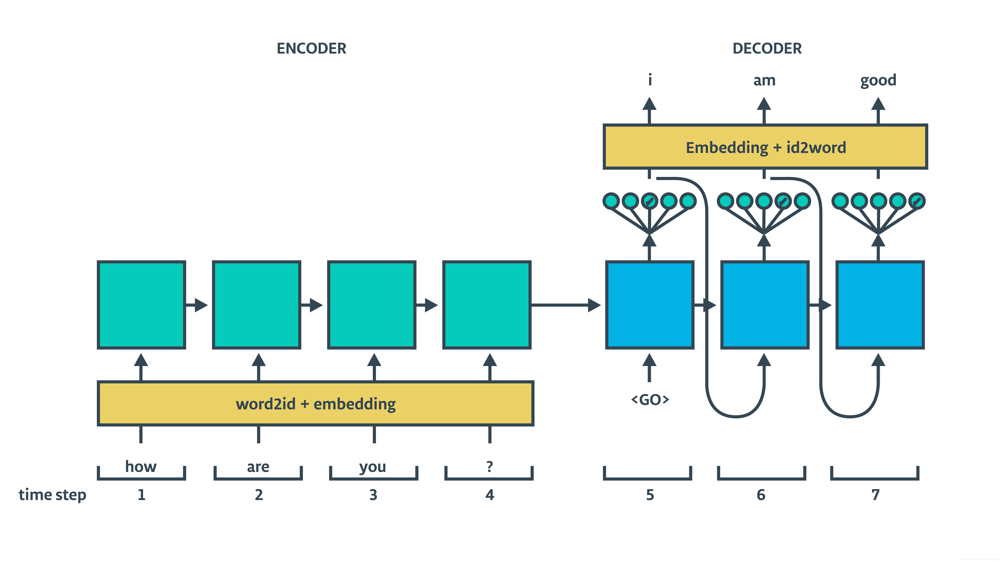

### 保存参数

保存 `batch_size` 和 `save_path` 参数以进行推论（for inference）。

In [18]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# Save parameters for checkpoint
helper.save_params(save_path)

# 检查点

In [19]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import tensorflow as tf
import numpy as np
import helper
import problem_unittests as tests

_, (source_vocab_to_int, target_vocab_to_int), (source_int_to_vocab, target_int_to_vocab) = helper.load_preprocess()
load_path = helper.load_params()

## 句子到序列

要向模型提供要翻译的句子，你首先需要预处理该句子。实现函数 `sentence_to_seq()` 以预处理新的句子。

- 将句子转换为小写形式
- 使用 `vocab_to_int` 将单词转换为 id
 - 如果单词不在词汇表中，将其转换为`<UNK>` 单词 id

In [20]:
def sentence_to_seq(sentence, vocab_to_int):
    """
    Convert a sentence to a sequence of ids
    :param sentence: String
    :param vocab_to_int: Dictionary to go from the words to an id
    :return: List of word ids
    """
    # TODO: Implement Function
    seq = [vocab_to_int.get(word, vocab_to_int['<UNK>']) for word in sentence.lower().split()]
    return seq


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_sentence_to_seq(sentence_to_seq)

Tests Passed


## 翻译

将 `translate_sentence` 从英语翻译成法语。

In [21]:
translate_sentence = 'he saw a old yellow truck .'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
translate_sentence = sentence_to_seq(translate_sentence, source_vocab_to_int)

loaded_graph = tf.Graph()
with tf.Session(graph=loaded_graph) as sess:
    # Load saved model
    loader = tf.train.import_meta_graph(load_path + '.meta')
    loader.restore(sess, load_path)

    input_data = loaded_graph.get_tensor_by_name('input:0')
    logits = loaded_graph.get_tensor_by_name('logits:0')
    keep_prob = loaded_graph.get_tensor_by_name('keep_prob:0')

    translate_logits = sess.run(logits, {input_data: [translate_sentence], keep_prob: 1.0})[0]

print('Input')
print('  Word Ids:      {}'.format([i for i in translate_sentence]))
print('  English Words: {}'.format([source_int_to_vocab[i] for i in translate_sentence]))

print('\nPrediction')
print('  Word Ids:      {}'.format([i for i in np.argmax(translate_logits, 1)]))
print('  French Words: {}'.format([target_int_to_vocab[i] for i in np.argmax(translate_logits, 1)]))

Input
  Word Ids:      [131, 25, 85, 50, 194, 115, 189]
  English Words: ['he', 'saw', 'a', 'old', 'yellow', 'truck', '.']

Prediction
  Word Ids:      [45, 287, 178, 33, 341, 349, 98, 242, 1]
  French Words: ['il', 'a', 'vu', 'un', 'nouveau', 'camion', 'jaune', '.', '<EOS>']


## 不完美的翻译

你可能注意到了，某些句子的翻译质量比其他的要好。因为你使用的数据集只有 227 个英语单词，但实际生活中有数千个单词，只有使用这些单词的句子结果才会比较理想。对于此项目，不需要达到完美的翻译。但是，如果你想创建更好的翻译模型，则需要更好的数据。

你可以使用 [WMT10 French-English corpus](http://www.statmt.org/wmt10/training-giga-fren.tar) 语料库训练模型。该数据集拥有更多的词汇，讨论的话题也更丰富。但是，训练时间要好多天的时间，所以确保你有 GPU 并且对于我们提供的数据集，你的神经网络性能很棒。提交此项目后，别忘了研究下 WMT10 语料库。


## 提交项目

提交项目时，确保先运行所有单元，然后再保存记事本。保存记事本文件为 “dlnd_language_translation.ipynb”，再通过菜单中的“文件” ->“下载为”将其另存为 HTML 格式。提交的项目文档中需包含“helper.py”和“problem_unittests.py”文件。
